<a href="https://colab.research.google.com/github/Sujitkar1511/Machine-Learning-With-Python/blob/main/Copy_of_NewDataSet__Allmodel_comparison_lime.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [6]:
# ==============================
# 1. INSTALL DEPENDENCIES
# ==============================
!pip install -q lightgbm catboost imbalanced-learn xgboost scikit-learn pandas numpy openpyxl

In [7]:
# ==============================
# 2. IMPORT LIBRARIES
# ==============================
import pandas as pd
import numpy as np
import time
import warnings
warnings.filterwarnings('ignore')

from sklearn.model_selection import train_test_split, StratifiedKFold, RandomizedSearchCV
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import (
    accuracy_score, precision_score, recall_score, f1_score,
    roc_auc_score, matthews_corrcoef, cohen_kappa_score,
    confusion_matrix
)

from imblearn.metrics import geometric_mean_score
from imblearn.over_sampling import ADASYN
from catboost import CatBoostClassifier

In [8]:
# ==============================
# 3. LOAD DATASET
# ==============================
df = pd.read_csv('/content/INCART 2-lead Arrhythmia Database.csv')


In [9]:
# ==============================
# 4. PREPROCESSING
# ==============================

# Remove column if exists
df = df.drop('duration', axis=1, errors='ignore')

# Handle unknown values
for col in df.select_dtypes(include='object').columns:
    df[col] = df[col].replace('unknown', df[col].mode()[0])

# Convert categorical columns
df = pd.get_dummies(df, drop_first=True)

# Select target column (last column)
target_column = df.columns[-1]

# Features and Target
X = df.drop(target_column, axis=1)
y = df[target_column]


In [10]:
# ==============================
# 5. SPLIT DATA
# ==============================
X_train, X_test, y_train, y_test = train_test_split(
    X,
    y,
    test_size=0.2,
    random_state=42,
    stratify=y
)

In [11]:
# ==============================
# 6. FEATURE SCALING
# ==============================
scaler = StandardScaler()

X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

In [12]:
# ADASYN
adasyn = ADASYN(random_state=42)
X_train_ad, y_train_ad = adasyn.fit_resample(X_train_scaled, y_train)

In [13]:
# ==============================
# 6. METRIC FUNCTIONS
# ==============================
def compute_metrics(y_true, y_pred, y_prob):
    tn, fp, fn, tp = confusion_matrix(y_true, y_pred).ravel()

    print(f"Accuracy    : {accuracy_score(y_true, y_pred):.4f}")
    print(f"Precision   : {precision_score(y_true, y_pred, zero_division=0):.4f}")
    print(f"Recall      : {recall_score(y_true, y_pred, zero_division=0):.4f}")
    print(f"Specificity : {tn / (tn + fp):.4f}")
    print(f"F1 Score    : {f1_score(y_true, y_pred, zero_division=0):.4f}")
    print(f"ROC-AUC     : {roc_auc_score(y_true, y_prob):.4f}")
    print(f"MCC         : {matthews_corrcoef(y_true, y_pred):.4f}")
    print(f"G-Mean      : {geometric_mean_score(y_true, y_pred):.4f}")
    print(f"Kappa       : {cohen_kappa_score(y_true, y_pred):.4f}")

# **CatBoostClassifier**

In [9]:
# ==============================
# 7. HYPERPARAMETER TUNING
# ==============================
params = {
    "iterations":[100,200],
    "depth":[4,5],
    "learning_rate":[0.03],
    "class_weights":[[1,2],[1,3]]
}

cv_small = StratifiedKFold(n_splits=3, shuffle=True, random_state=42)

rscv = RandomizedSearchCV(
    CatBoostClassifier(verbose=0),
    params,
    n_iter=2,
    scoring='f1',
    cv=cv_small,
    n_jobs=-1
)

rscv.fit(X_train_ad, y_train_ad)
best = rscv.best_estimator_

print("🔥 Tuned Model Performance (Test Set)")
y_pred = best.predict(X_test_scaled)
y_prob = best.predict_proba(X_test_scaled)[:,1]
compute_metrics(y_test, y_pred, y_prob)

print("Best Params:", rscv.best_params_)


🔥 Tuned Model Performance (Test Set)
Accuracy    : 0.9984
Precision   : 0.9860
Recall      : 1.0000
Specificity : 0.9982
F1 Score    : 0.9929
ROC-AUC     : 0.9999
MCC         : 0.9920
G-Mean      : 0.9991
Kappa       : 0.9920
Best Params: {'learning_rate': 0.03, 'iterations': 100, 'depth': 5, 'class_weights': [1, 3]}


In [14]:
# ==============================
# 8. CROSS VALIDATION (MAIN)
# ==============================
skf = StratifiedKFold(n_splits=10, shuffle=True, random_state=42)

In [11]:
results1 = []

for fold, (train_idx, test_idx) in enumerate(skf.split(X, y)):

    X_train_f, X_test_f = X.iloc[train_idx], X.iloc[test_idx]
    y_train_f, y_test_f = y.iloc[train_idx], y.iloc[test_idx]

    # Scaling
    scaler = StandardScaler()
    X_train_f = scaler.fit_transform(X_train_f)
    X_test_f  = scaler.transform(X_test_f)

    # ADASYN
    adasyn = ADASYN(random_state=42)
    X_train_f, y_train_f = adasyn.fit_resample(X_train_f, y_train_f)

    # Train
    start_time = time.time()
    best.fit(X_train_f, y_train_f)
    training_time = time.time() - start_time

    # Predict
    y_pred = best.predict(X_test_f)
    y_prob = best.predict_proba(X_test_f)[:,1]

    # Metrics
    acc = accuracy_score(y_test_f, y_pred)
    prec = precision_score(y_test_f, y_pred, zero_division=0)
    rec = recall_score(y_test_f, y_pred, zero_division=0)
    f1 = f1_score(y_test_f, y_pred, zero_division=0)

    tn, fp, fn, tp = confusion_matrix(y_test_f, y_pred).ravel()

    specificity = tn/(tn+fp)
    fpr = fp/(fp+tn)
    gm = np.sqrt(rec * specificity)

    auc = roc_auc_score(y_test_f, y_prob)
    mcc = matthews_corrcoef(y_test_f, y_pred)
    kappa = cohen_kappa_score(y_test_f, y_pred)
    balanced_acc = (rec + specificity)/2

    results1.append({
        "Fold": fold+1,
        "Classifier": "CatBoost",
        "Accuracy": acc,
        "Precision": prec,
        "Recall": rec,
        "Specificity": specificity,
        "F1": f1,
        "GM": gm,
        "FPR": fpr,
        "AUC": auc,
        "MCC": mcc,
        "Kappa": kappa,
        "Balanced Accuracy": balanced_acc,
        "Training Time (s)": training_time
    })

In [12]:
# ==============================
# 9. PRINT RESULTS
# ==============================
df_results = pd.DataFrame(results1)

print("\n===== Fold Results =====")
print(df_results.to_string(index=False))

print("\n===== Average Results =====")
print(df_results.mean(numeric_only=True))


# ==============================
# 10. SAVE TO EXCEL
# ==============================
df_results.to_excel("catboost_results.xlsx", index=False)

print("\n✅ Results saved to catboost_results.xlsx")


===== Fold Results =====
 Fold Classifier  Accuracy  Precision  Recall  Specificity       F1       GM      FPR      AUC      MCC    Kappa  Balanced Accuracy  Training Time (s)
    1   CatBoost  0.998407   0.986193     1.0     0.998202 0.993049 0.999101 0.001798 0.999900 0.992179 0.992149           0.999101          11.882799
    2   CatBoost  0.998634   0.988142     1.0     0.998459 0.994036 0.999229 0.001541 0.999834 0.993287 0.993265           0.999229          14.144670
    3   CatBoost  0.998748   0.989120     1.0     0.998587 0.994530 0.999293 0.001413 0.999942 0.993842 0.993823           0.999294          11.995157
    4   CatBoost  0.998976   0.991080     1.0     0.998844 0.995520 0.999422 0.001156 0.999913 0.994955 0.994942           0.999422          11.867333
    5   CatBoost  0.998919   0.990589     1.0     0.998780 0.995272 0.999390 0.001220 0.999922 0.994676 0.994662           0.999390          12.518047
    6   CatBoost  0.998464   0.986680     1.0     0.998266 0.993295 


--- SHAP EXPLANATION ---


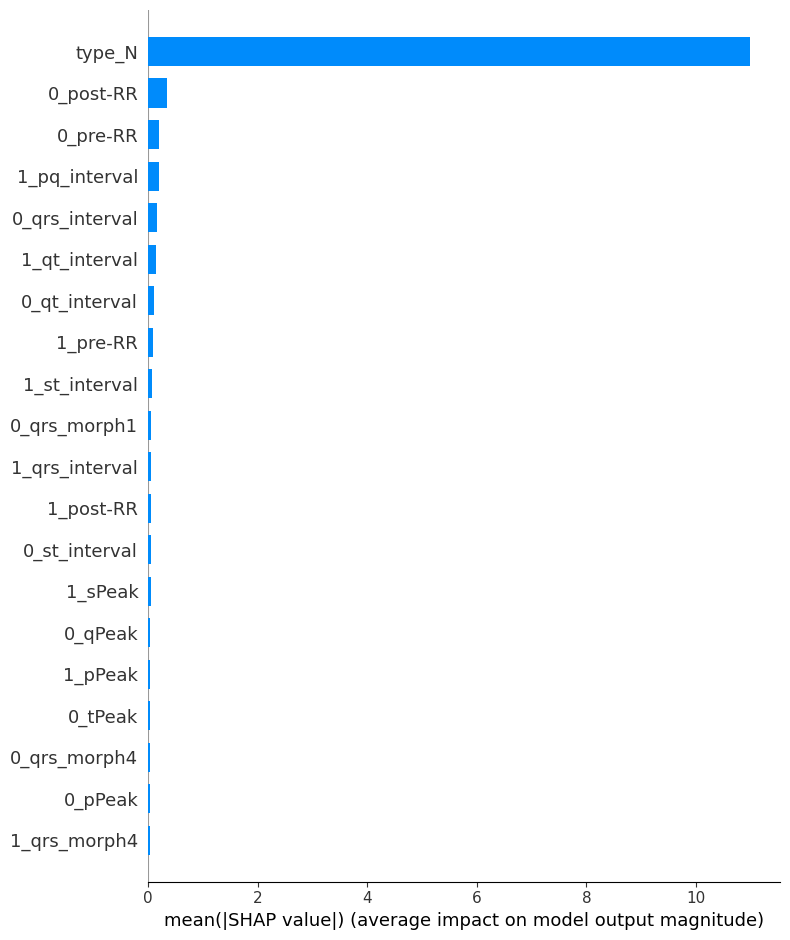

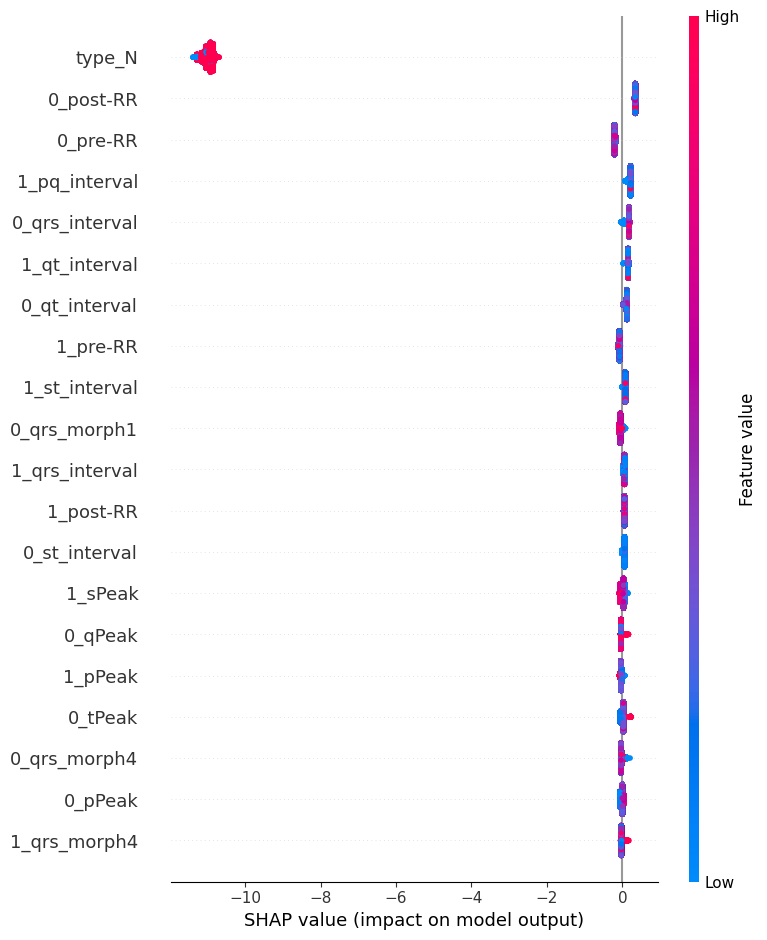

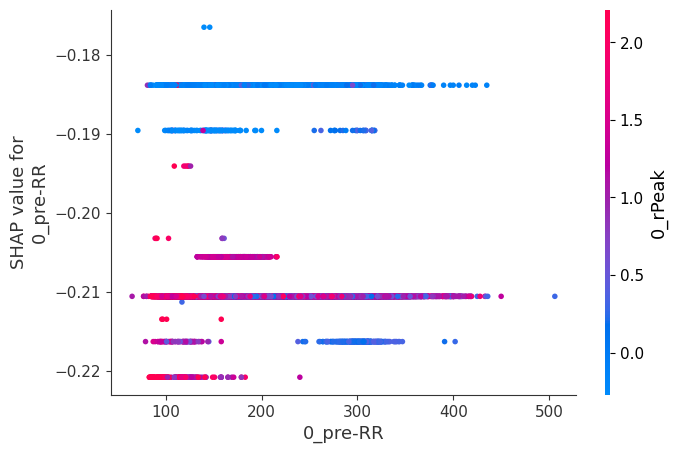

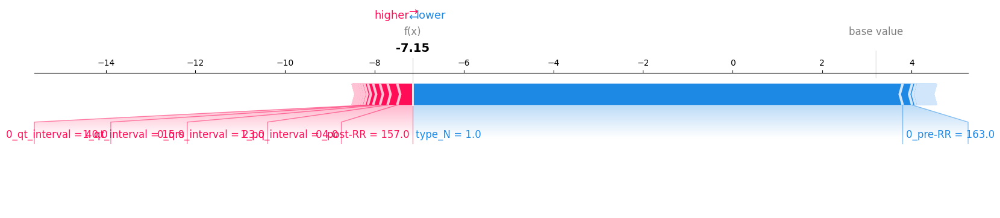

In [13]:
# ==============================
# SHAP EXPLAINABILITY (FINAL FIX)
# ==============================

print("\n--- SHAP EXPLANATION ---")

import shap
import matplotlib.pyplot as plt

# Explainer
explainer = shap.TreeExplainer(best)

# SHAP values
shap_values = explainer.shap_values(X_test)

# ✅ Handle classification
if isinstance(shap_values, list):
    shap_values_class1 = shap_values[1]
else:
    shap_values_class1 = shap_values

# -------------------------------
# 1. GLOBAL FEATURE IMPORTANCE
# -------------------------------
shap.summary_plot(shap_values_class1, X_test, plot_type="bar")

# -------------------------------
# 2. DETAILED SUMMARY PLOT
# -------------------------------
shap.summary_plot(shap_values_class1, X_test)

# -------------------------------
# 3. DEPENDENCE PLOT
# -------------------------------
shap.dependence_plot(
    X_test.columns[0],
    shap_values_class1,
    X_test
)

# -------------------------------
# 4. LOCAL EXPLANATION (FORCE PLOT)
# -------------------------------
base_value = explainer.expected_value
if isinstance(base_value, list):
    base_value = base_value[1]

shap.force_plot(
    base_value,
    shap_values_class1[0],
    X_test.iloc[0],
    matplotlib=True
)

# **LIME EXPLANATION (CatBoostClassifier)**

In [16]:
# ==========================================
# INSTALL LIME
# ==========================================
!pip install -q lime

# ==========================================
# IMPORT LIBRARIES
# ==========================================
import numpy as np
import pandas as pd

from lime.lime_tabular import LimeTabularExplainer
from IPython.display import HTML, display

print("\n--- LIME EXPLANATION (CatBoost) ---")

# ==========================================
# CONVERT DATA TO NUMPY
# ==========================================
X_train_np = X_train.values
X_test_np  = X_test.values

# ==========================================
# CREATE LIME EXPLAINER
# ==========================================
lime_explainer = LimeTabularExplainer(
    training_data=X_train_np,
    feature_names=X_train.columns.tolist(),
    class_names=['No', 'Yes'],
    mode='classification',
    discretize_continuous=True,
    random_state=42
)

# ==========================================
# EXPLAIN FIRST TEST SAMPLE
# ==========================================
lime_exp = lime_explainer.explain_instance(
    data_row=X_test_np[0],
    predict_fn=best.predict_proba,   # CatBoost model
    num_features=10
)

# ==========================================
# DISPLAY EXPLANATION
# ==========================================
display(HTML(lime_exp.as_html()))

# ==========================================
# SAVE HTML FILE
# ==========================================
lime_exp.save_to_file("lime_catboost.html")

print("\n✅ LIME explanation saved as 'lime_catboost.html'")

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 275.7/275.7 kB 6.0 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done

--- LIME EXPLANATION (CatBoost) ---



✅ LIME explanation saved as 'lime_catboost.html'


# **LightGBM**

In [10]:
from lightgbm import LGBMClassifier

In [11]:
# ==============================
# LIGHTGBM TUNING
# ==============================
params_lgb = {
    "n_estimators": [100, 200],
    "learning_rate": [0.05, 0.1],
    "num_leaves": [31, 50],
    "max_depth": [-1, 10],
    "subsample": [0.8, 1.0],
    "colsample_bytree": [0.8, 1.0]
}

rscv_lgb = RandomizedSearchCV(
    LGBMClassifier(class_weight='balanced'),
    params_lgb,
    n_iter=2,
    scoring='f1',
    cv=3,
    n_jobs=-1
)

rscv_lgb.fit(X_train_ad, y_train_ad)

best_lgb = rscv_lgb.best_estimator_

[LightGBM] [Info] Number of positive: 124539, number of negative: 124583
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.140437 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 14615
[LightGBM] [Info] Number of data points in the train set: 249122, number of used features: 108
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Info] Start training from score 0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best 

In [12]:
print("\n LightGBM (Tuned)")

y_pred_lgb = best_lgb.predict(X_test_scaled)
y_prob_lgb = best_lgb.predict_proba(X_test_scaled)[:,1]

compute_metrics(y_test, y_pred_lgb, y_prob_lgb)

print("Best Params (LGB):", rscv_lgb.best_params_)


 LightGBM (Tuned)
Accuracy    : 0.9991
Precision   : 0.9926
Recall      : 0.9992
Specificity : 0.9990
F1 Score    : 0.9959
ROC-AUC     : 1.0000
MCC         : 0.9954
G-Mean      : 0.9991
Kappa       : 0.9954
Best Params (LGB): {'subsample': 0.8, 'num_leaves': 50, 'n_estimators': 200, 'max_depth': -1, 'learning_rate': 0.1, 'colsample_bytree': 1.0}


In [13]:
results_lgb = []

for fold, (train_idx, test_idx) in enumerate(skf.split(X, y)):

    X_train_f, X_test_f = X.iloc[train_idx], X.iloc[test_idx]
    y_train_f, y_test_f = y.iloc[train_idx], y.iloc[test_idx]

    # Scaling (optional but keeping consistent)
    scaler = StandardScaler()
    X_train_f = scaler.fit_transform(X_train_f)
    X_test_f  = scaler.transform(X_test_f)

    # ADASYN
    adasyn = ADASYN(random_state=42)
    X_train_f, y_train_f = adasyn.fit_resample(X_train_f, y_train_f)

    # Train
    start_time = time.time()
    best_lgb.fit(X_train_f, y_train_f)
    training_time = time.time() - start_time

    # Predict
    y_pred = best_lgb.predict(X_test_f)
    y_prob = best_lgb.predict_proba(X_test_f)[:,1]

    # Metrics
    acc = accuracy_score(y_test_f, y_pred)
    prec = precision_score(y_test_f, y_pred, zero_division=0)
    rec = recall_score(y_test_f, y_pred, zero_division=0)
    f1 = f1_score(y_test_f, y_pred, zero_division=0)

    tn, fp, fn, tp = confusion_matrix(y_test_f, y_pred).ravel()

    specificity = tn/(tn+fp)
    fpr = fp/(fp+tn)
    gm = np.sqrt(rec * specificity)

    auc = roc_auc_score(y_test_f, y_prob)
    mcc = matthews_corrcoef(y_test_f, y_pred)
    kappa = cohen_kappa_score(y_test_f, y_pred)
    balanced_acc = (rec + specificity)/2

    results_lgb.append({
        "Fold": fold+1,
        "Classifier": "LightGBM",
        "Accuracy": acc,
        "Precision": prec,
        "Recall": rec,
        "Specificity": specificity,
        "F1": f1,
        "GM": gm,
        "FPR": fpr,
        "AUC": auc,
        "MCC": mcc,
        "Kappa": kappa,
        "Balanced Accuracy": balanced_acc,
        "Training Time (s)": training_time
    })

[LightGBM] [Info] Number of positive: 140187, number of negative: 140156
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.230087 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 14482
[LightGBM] [Info] Number of data points in the train set: 280343, number of used features: 108
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=-0.000000
[LightGBM] [Info] Start training from score -0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, bes

In [14]:
df_lgb = pd.DataFrame(results_lgb)

final_df = pd.concat([ df_lgb])

In [15]:
print("\n===== LIGHTGBM  MODELS =====")
print(final_df.to_string(index=False))

print("\n===== AVERAGE COMPARISON =====")
print(final_df.groupby("Classifier").mean(numeric_only=True))


===== LIGHTGBM  MODELS =====
 Fold Classifier  Accuracy  Precision  Recall  Specificity       F1       GM      FPR      AUC      MCC    Kappa  Balanced Accuracy  Training Time (s)
    1   LightGBM  0.998976   0.991567  0.9995     0.998908 0.995518 0.999204 0.001092 0.999989 0.994950 0.994940           0.999204          17.086293
    2   LightGBM  0.999146   0.993045  0.9995     0.999101 0.996262 0.999300 0.000899 0.999979 0.995787 0.995780           0.999301          16.520308
    3   LightGBM  0.999317   0.994036  1.0000     0.999229 0.997009 0.999615 0.000771 0.999992 0.996629 0.996624           0.999615          15.897168
    4   LightGBM  0.999260   0.993542  1.0000     0.999165 0.996761 0.999583 0.000835 0.999976 0.996350 0.996343           0.999583          16.267643
    5   LightGBM  0.999431   0.996012  0.9990     0.999486 0.997504 0.999243 0.000514 0.999979 0.997184 0.997183           0.999243          16.899475
    6   LightGBM  0.999090   0.992552  0.9995     0.999037 0.996


--- SHAP EXPLANATION (LightGBM) ---


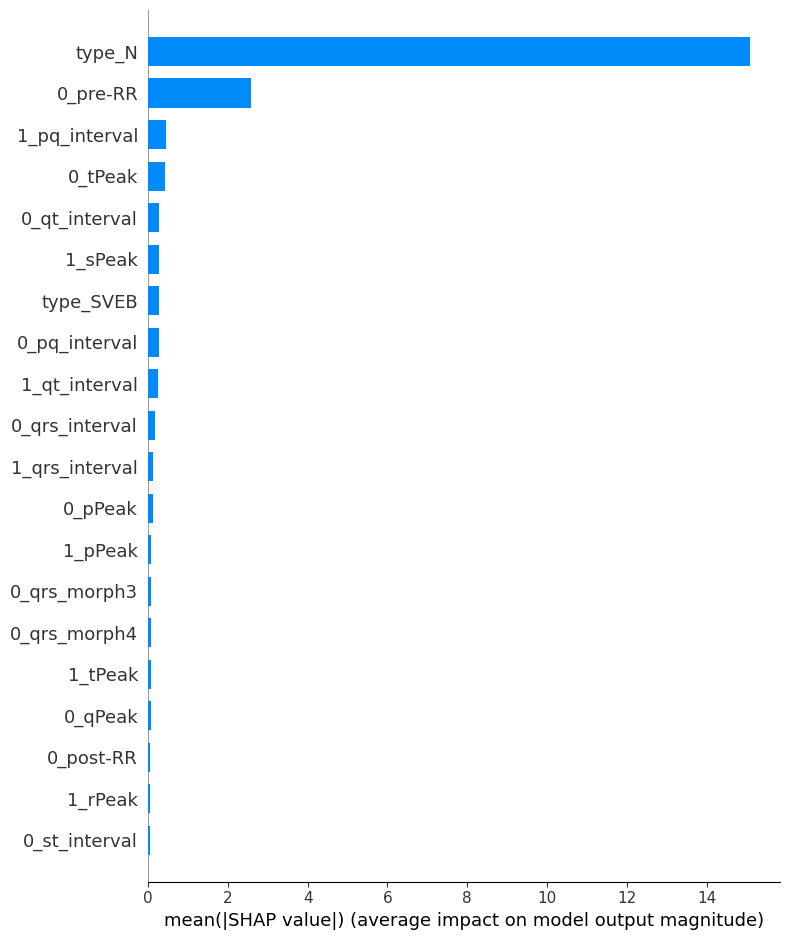

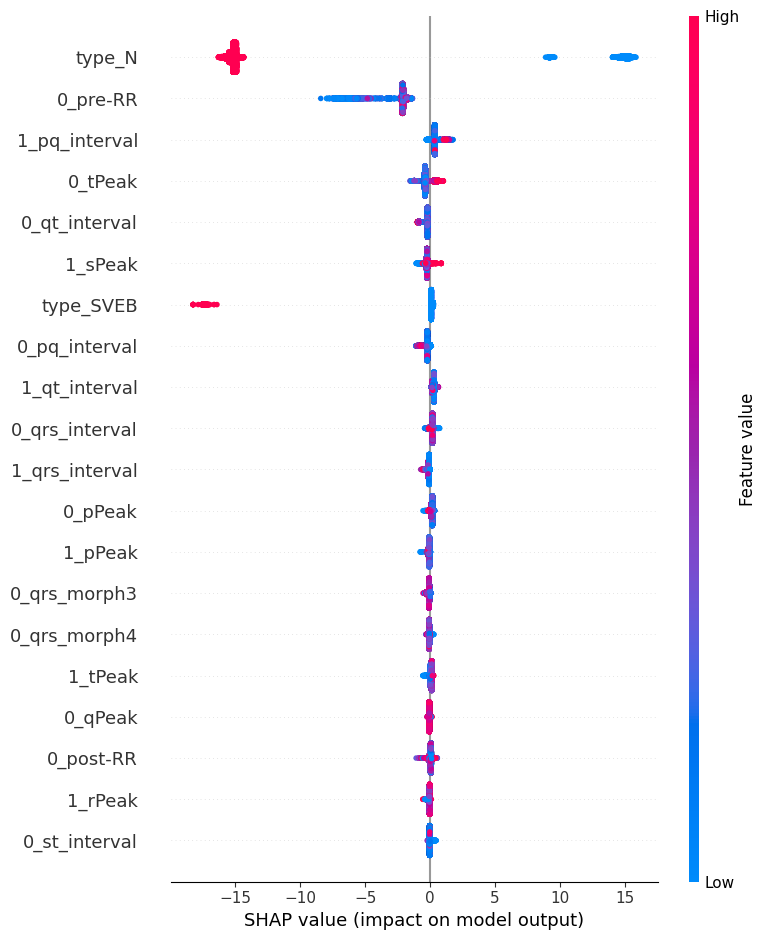

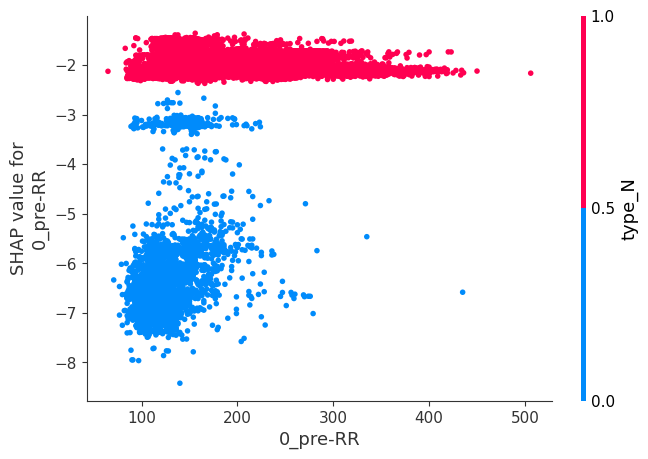

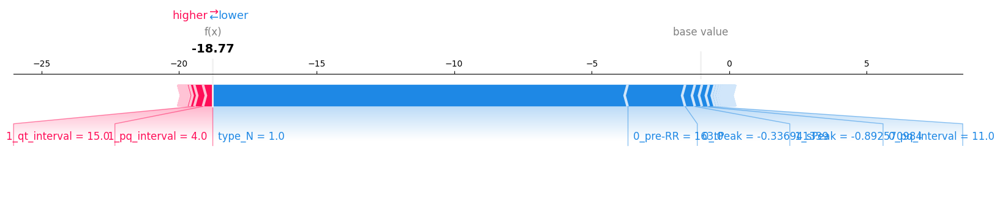

In [16]:
# ==============================
# SHAP EXPLAINABILITY (LightGBM FINAL)
# ==============================

print("\n--- SHAP EXPLANATION (LightGBM) ---")

import shap
import numpy as np

# Explainer
explainer = shap.TreeExplainer(best_lgb)

# SHAP values
shap_values = explainer.shap_values(X_test)

# ✅ Handle classification (binary)
if isinstance(shap_values, list):
    shap_values_class1 = shap_values[1]
else:
    shap_values_class1 = shap_values

# ✅ Ensure 2D shape
if len(shap_values_class1.shape) == 1:
    shap_values_class1 = shap_values_class1.reshape(1, -1)

# -------------------------------
# 1. GLOBAL FEATURE IMPORTANCE
# -------------------------------
shap.summary_plot(shap_values_class1, X_test, plot_type="bar")

# -------------------------------
# 2. DETAILED SUMMARY
# -------------------------------
shap.summary_plot(shap_values_class1, X_test)

# -------------------------------
# 3. DEPENDENCE PLOT
# -------------------------------
shap.dependence_plot(
    X_test.columns[0],
    shap_values_class1,
    X_test
)

# -------------------------------
# 4. LOCAL EXPLANATION (FORCE PLOT)
# -------------------------------
base_value = explainer.expected_value
if isinstance(base_value, list):
    base_value = base_value[1]

shap.force_plot(
    base_value,
    shap_values_class1[0],
    X_test.iloc[0],
    matplotlib=True
)

# **LIME EXPLANATION (LightGBM)**

In [17]:
# ==============================
# LIME EXPLANATION (LightGBM)
# ==============================

# 🔥 Run once if needed:
# !pip install lime

print("\n--- LIME EXPLANATION (LightGBM) ---")

from lime.lime_tabular import LimeTabularExplainer
import numpy as np
import pandas as pd

# -------------------------------
# 1. Prepare data (same as training)
# -------------------------------
X_train_np = np.array(X_train)   # use same format used in model
X_test_np  = np.array(X_test)

# -------------------------------
# 2. Create LIME Explainer
# -------------------------------
lime_explainer = LimeTabularExplainer(
    training_data=X_train_np,
    feature_names=X_train.columns,     # correct feature names
    class_names=['No', 'Yes'],         # ⚠️ adjust based on your model
    mode='classification'
)

# -------------------------------
# 3. Explain one instance
# -------------------------------
lime_exp = lime_explainer.explain_instance(
    X_test_np[0],                     # first test sample
    best_lgb.predict_proba,           # LightGBM model
    num_features=10
)

# -------------------------------
# 4. Show explanation
# -------------------------------
lime_exp.show_in_notebook(show_table=True)

# -------------------------------
# 5. (Optional) Save as HTML
# -------------------------------
lime_exp.save_to_file("lime_lightgbm.html")


--- LIME EXPLANATION (LightGBM) ---


# **XGBoost**

In [18]:
from xgboost import XGBClassifier

In [19]:
#Hyperparameter Tuning

# ==============================
# XGBOOST TUNING
# ==============================
params_xgb = {
    "n_estimators": [100, 200],
    "max_depth": [3, 5, 7],
    "learning_rate": [0.05, 0.1],
    "subsample": [0.8, 1.0],
    "colsample_bytree": [0.8, 1.0]
}

rscv_xgb = RandomizedSearchCV(
    XGBClassifier(use_label_encoder=False, eval_metric='logloss'),
    params_xgb,
    n_iter=2,
    scoring='f1',
    cv=3,
    n_jobs=-1
)

rscv_xgb.fit(X_train_ad, y_train_ad)

best_xgb = rscv_xgb.best_estimator_

In [20]:
print("\n⚡ XGBoost (Tuned)")

y_pred_xgb = best_xgb.predict(X_test_scaled)
y_prob_xgb = best_xgb.predict_proba(X_test_scaled)[:,1]

compute_metrics(y_test, y_pred_xgb, y_prob_xgb)

print("Best Params (XGB):", rscv_xgb.best_params_)


⚡ XGBoost (Tuned)
Accuracy    : 0.9984
Precision   : 0.9860
Recall      : 1.0000
Specificity : 0.9982
F1 Score    : 0.9929
ROC-AUC     : 0.9996
MCC         : 0.9920
G-Mean      : 0.9991
Kappa       : 0.9920
Best Params (XGB): {'subsample': 0.8, 'n_estimators': 100, 'max_depth': 3, 'learning_rate': 0.05, 'colsample_bytree': 1.0}


In [21]:
results_xgb = []

for fold, (train_idx, test_idx) in enumerate(skf.split(X, y)):

    X_train_f, X_test_f = X.iloc[train_idx], X.iloc[test_idx]
    y_train_f, y_test_f = y.iloc[train_idx], y.iloc[test_idx]

    # Scaling
    scaler = StandardScaler()
    X_train_f = scaler.fit_transform(X_train_f)
    X_test_f  = scaler.transform(X_test_f)

    # ADASYN
    adasyn = ADASYN(random_state=42)
    X_train_f, y_train_f = adasyn.fit_resample(X_train_f, y_train_f)

    # Train
    start_time = time.time()
    best_xgb.fit(X_train_f, y_train_f)
    training_time = time.time() - start_time

    # Predict
    y_pred = best_xgb.predict(X_test_f)
    y_prob = best_xgb.predict_proba(X_test_f)[:,1]

    # Metrics
    acc = accuracy_score(y_test_f, y_pred)
    prec = precision_score(y_test_f, y_pred, zero_division=0)
    rec = recall_score(y_test_f, y_pred, zero_division=0)
    f1 = f1_score(y_test_f, y_pred, zero_division=0)

    tn, fp, fn, tp = confusion_matrix(y_test_f, y_pred).ravel()

    specificity = tn/(tn+fp)
    fpr = fp/(fp+tn)
    gm = np.sqrt(rec * specificity)

    auc = roc_auc_score(y_test_f, y_prob)
    mcc = matthews_corrcoef(y_test_f, y_pred)
    kappa = cohen_kappa_score(y_test_f, y_pred)
    balanced_acc = (rec + specificity)/2

    results_xgb.append({
        "Fold": fold+1,
        "Classifier": "XGBoost",
        "Accuracy": acc,
        "Precision": prec,
        "Recall": rec,
        "Specificity": specificity,
        "F1": f1,
        "GM": gm,
        "FPR": fpr,
        "AUC": auc,
        "MCC": mcc,
        "Kappa": kappa,
        "Balanced Accuracy": balanced_acc,
        "Training Time (s)": training_time
    })

In [22]:
df_xgb = pd.DataFrame(results_xgb)

final_df = pd.concat([ df_xgb])

In [23]:
print("\n===== ALL MODELS =====")
print(final_df.to_string(index=False))

print("\n===== AVERAGE COMPARISON =====")
print(final_df.groupby("Classifier").mean(numeric_only=True))


===== ALL MODELS =====
 Fold Classifier  Accuracy  Precision  Recall  Specificity       F1       GM      FPR      AUC      MCC    Kappa  Balanced Accuracy  Training Time (s)
    1    XGBoost  0.998407   0.986193     1.0     0.998202 0.993049 0.999101 0.001798 0.999479 0.992179 0.992149           0.999101          10.343917
    2    XGBoost  0.998634   0.988142     1.0     0.998459 0.994036 0.999229 0.001541 0.999597 0.993287 0.993265           0.999229          10.645324
    3    XGBoost  0.998748   0.989120     1.0     0.998587 0.994530 0.999293 0.001413 0.999821 0.993842 0.993823           0.999294          10.579072
    4    XGBoost  0.998919   0.990589     1.0     0.998780 0.995272 0.999390 0.001220 0.999753 0.994676 0.994662           0.999390          10.866776
    5    XGBoost  0.998919   0.990589     1.0     0.998780 0.995272 0.999390 0.001220 0.999788 0.994676 0.994662           0.999390           9.048199
    6    XGBoost  0.998464   0.986680     1.0     0.998266 0.993295 0.


--- SHAP EXPLANATION (XGBoost) ---


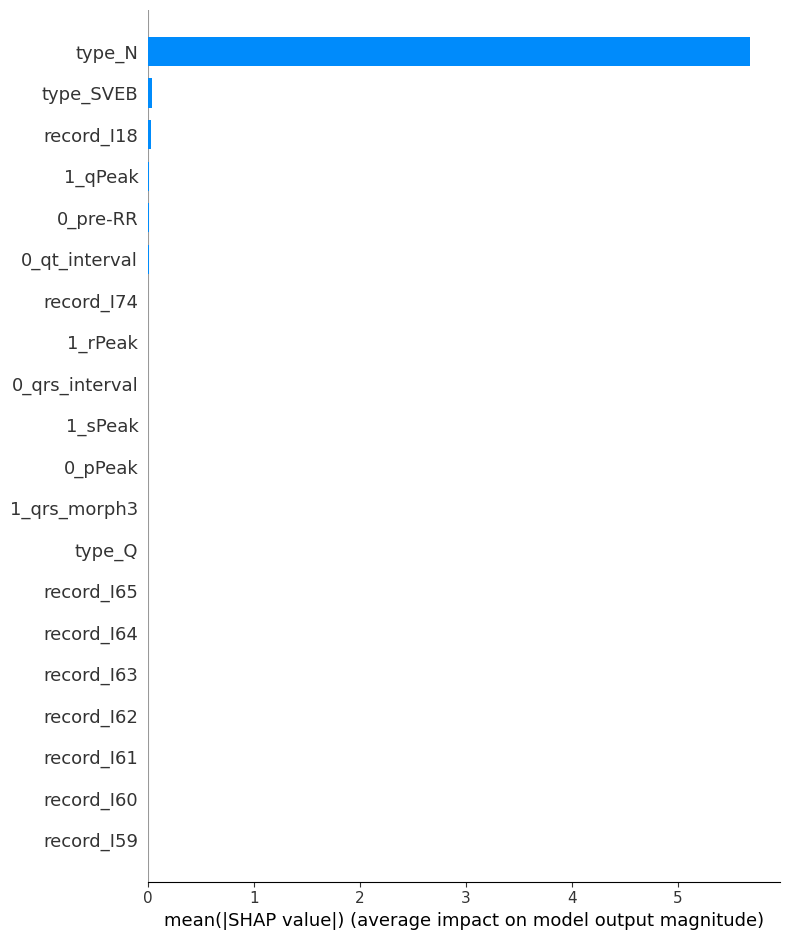

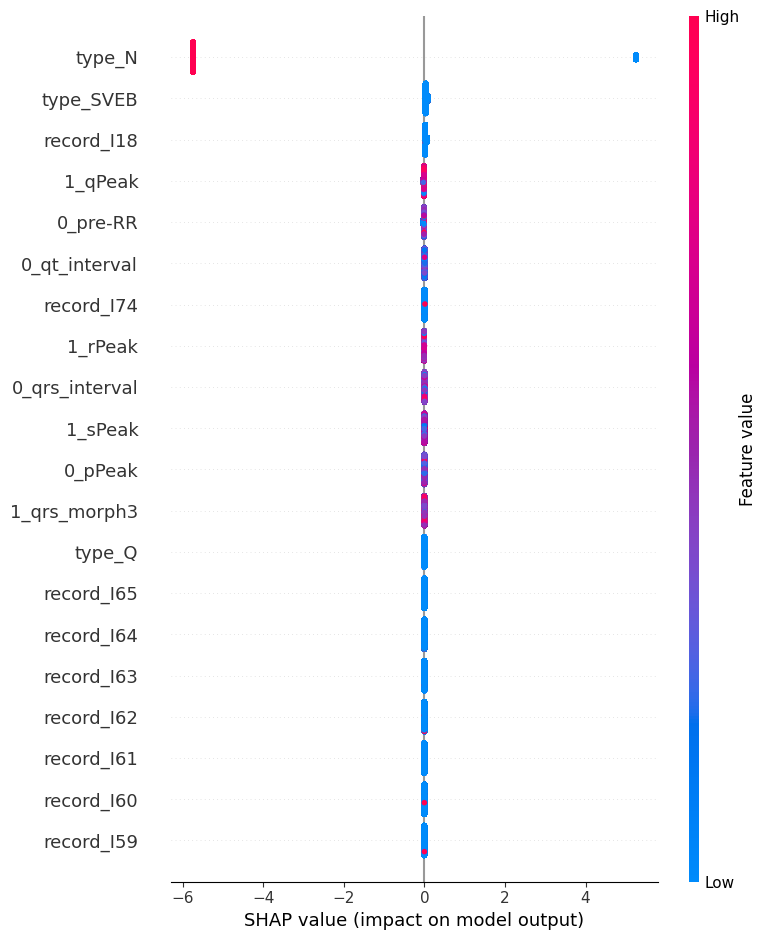

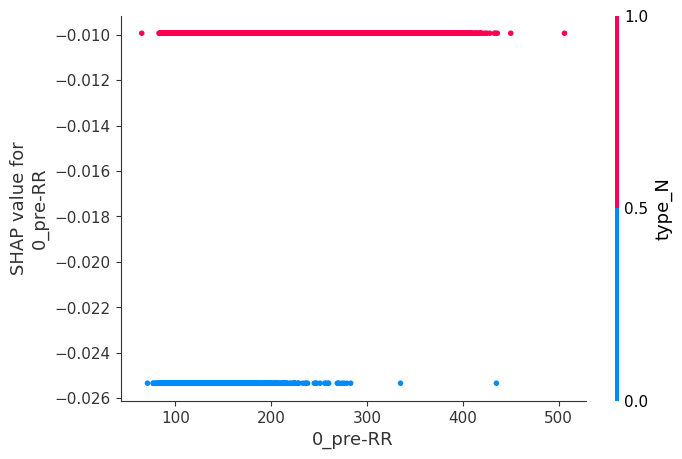

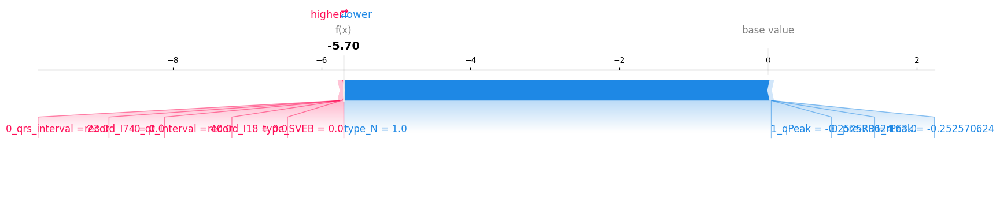

In [24]:
# ==============================
# SHAP EXPLANATION (XGBOOST FIXED)
# ==============================

print("\n--- SHAP EXPLANATION (XGBoost) ---")

import shap
import numpy as np

# Explainer
explainer = shap.TreeExplainer(best_xgb)

# SHAP values
shap_values = explainer.shap_values(X_test)

# ✅ Handle classification
if isinstance(shap_values, list):
    shap_values_class1 = shap_values[1]
else:
    shap_values_class1 = shap_values

# ✅ Ensure correct shape
if len(shap_values_class1.shape) == 1:
    shap_values_class1 = shap_values_class1.reshape(1, -1)

# -------------------------------
# 1. GLOBAL FEATURE IMPORTANCE
# -------------------------------
shap.summary_plot(shap_values_class1, X_test, plot_type="bar")

# -------------------------------
# 2. DETAILED SUMMARY
# -------------------------------
shap.summary_plot(shap_values_class1, X_test)

# -------------------------------
# 3. DEPENDENCE PLOT
# -------------------------------
shap.dependence_plot(
    X_test.columns[0],
    shap_values_class1,
    X_test
)

# -------------------------------
# 4. LOCAL EXPLANATION (FORCE PLOT)
# -------------------------------
base_value = explainer.expected_value
if isinstance(base_value, list):
    base_value = base_value[1]

shap.force_plot(
    base_value,
    shap_values_class1[0],
    X_test.iloc[0],
    matplotlib=True
)

# **LIME EXPLAINABILITY for XGBoost  **

In [25]:
# ==============================
# FINAL LIME EXPLANATION
# ==============================

# 🔥 Install LIME (run once)
!pip install lime

print("\n--- LIME EXPLANATION ---")

from lime.lime_tabular import LimeTabularExplainer
import numpy as np
import pandas as pd

# -------------------------------
# 1. Ensure correct data format
# -------------------------------
# Convert to numpy if needed
X_train_np = np.array(X_train_scaled)
X_test_np  = np.array(X_test_scaled)

# -------------------------------
# 2. Create LIME Explainer
# -------------------------------
lime_explainer = LimeTabularExplainer(
    training_data=X_train_np,
    feature_names=X_train.columns,     # ✅ correct feature names
    class_names=['No', 'Yes'],         # ⚠️ order must match model output
    mode='classification'
)

# -------------------------------
# 3. Explain one instance
# -------------------------------
lime_exp = lime_explainer.explain_instance(
    X_test_np[0],                     # first sample
    best_xgb.predict_proba,
    num_features=10                  # show top features
)

# -------------------------------
# 4. Show explanation
# -------------------------------
lime_exp.show_in_notebook(show_table=True)

# -------------------------------
# 5. (Optional) Save as HTML
# -------------------------------
lime_exp.save_to_file("lime_explanation.html")


--- LIME EXPLANATION ---


# Gradient Boosting (GBM)

In [15]:
#Import GBM

from sklearn.ensemble import GradientBoostingClassifier

In [ ]:
params_gbm = {
    "n_estimators": [50],     # smaller = faster
    "learning_rate": [0.1],
    "max_depth": [2]          # shallow trees = faster
}

# ------------------------------------------
# FAST CROSS VALIDATION
# ------------------------------------------
cv_fast = StratifiedKFold(
    n_splits=2,
    shuffle=True,
    random_state=42
)

# ------------------------------------------
# FAST MODEL
# ------------------------------------------
gbm_fast = GradientBoostingClassifier(
    subsample=0.8,            # faster training
    random_state=42
)

# ------------------------------------------
# RANDOM SEARCH
# ------------------------------------------
rscv_gbm = RandomizedSearchCV(
    estimator=gbm_fast,
    param_distributions=params_gbm,
    n_iter=1,
    scoring='f1',
    cv=cv_fast,
    n_jobs=-1,
    verbose=0,
    random_state=42
)

# ------------------------------------------
# TRAIN
# ------------------------------------------
rscv_gbm.fit(X_train_ad, y_train_ad)

# ------------------------------------------
# BEST MODEL
# ------------------------------------------
best_gbm = rscv_gbm.best_estimator_

print("\n✅ Best Parameters:")
print(rscv_gbm.best_params_)

print("\n✅ Best F1 Score:")
print(round(rscv_gbm.best_score_, 4))

In [ ]:
#Test Performance

print("\n Gradient Boosting (Tuned)")

y_pred_gbm = best_gbm.predict(X_test_scaled)
y_prob_gbm = best_gbm.predict_proba(X_test_scaled)[:,1]

compute_metrics(y_test, y_pred_gbm, y_prob_gbm)

print("Best Params (GBM):", rscv_gbm.best_params_)

In [1]:
#Cross Validation (GBM)

results_gbm = []

for fold, (train_idx, test_idx) in enumerate(skf.split(X, y)):

    X_train_f, X_test_f = X.iloc[train_idx], X.iloc[test_idx]
    y_train_f, y_test_f = y.iloc[train_idx], y.iloc[test_idx]

    # Scaling
    scaler = StandardScaler()
    X_train_f = scaler.fit_transform(X_train_f)
    X_test_f  = scaler.transform(X_test_f)

    # ADASYN
    adasyn = ADASYN(random_state=42)
    X_train_f, y_train_f = adasyn.fit_resample(X_train_f, y_train_f)

    # Train
    start_time = time.time()
    best_gbm.fit(X_train_f, y_train_f)
    training_time = time.time() - start_time

    # Predict
    y_pred = best_gbm.predict(X_test_f)
    y_prob = best_gbm.predict_proba(X_test_f)[:,1]

    # Metrics
    acc = accuracy_score(y_test_f, y_pred)
    prec = precision_score(y_test_f, y_pred, zero_division=0)
    rec = recall_score(y_test_f, y_pred, zero_division=0)
    f1 = f1_score(y_test_f, y_pred, zero_division=0)

    tn, fp, fn, tp = confusion_matrix(y_test_f, y_pred).ravel()

    specificity = tn/(tn+fp)
    fpr = fp/(fp+tn)
    gm = np.sqrt(rec * specificity)

    auc = roc_auc_score(y_test_f, y_prob)
    mcc = matthews_corrcoef(y_test_f, y_pred)
    kappa = cohen_kappa_score(y_test_f, y_pred)
    balanced_acc = (rec + specificity)/2

    results_gbm.append({
        "Fold": fold+1,
        "Classifier": "Gradient Boosting",
        "Accuracy": acc,
        "Precision": prec,
        "Recall": rec,
        "Specificity": specificity,
        "F1": f1,
        "GM": gm,
        "FPR": fpr,
        "AUC": auc,
        "MCC": mcc,
        "Kappa": kappa,
        "Balanced Accuracy": balanced_acc,
        "Training Time (s)": training_time
    })

NameError: name 'skf' is not defined

In [ ]:
df_gbm = pd.DataFrame(results_gbm)

final_df = pd.concat([df_gbm])

In [ ]:
#Print Comparison

print("\n===== GBM MODELS =====")
print(final_df.to_string(index=False))

print("\n===== AVERAGE COMPARISON =====")
print(final_df.groupby("Classifier").mean(numeric_only=True))


===== GBM MODELS =====
 Fold        Classifier  Accuracy  Precision   Recall  Specificity       F1       GM      FPR      AUC      MCC    Kappa  Balanced Accuracy  Training Time (s)
    1 Gradient Boosting  0.893178   0.537267 0.372845     0.959234 0.440204 0.598035 0.040766 0.787277 0.391107 0.383282           0.666039          43.685441
    2 Gradient Boosting  0.889294   0.513514 0.327586     0.960602 0.400000 0.560963 0.039398 0.777296 0.352802 0.342287           0.644094          41.815073
    3 Gradient Boosting  0.888808   0.509091 0.362069     0.955677 0.423174 0.588236 0.044323 0.792659 0.370053 0.363581           0.658873          42.517095
    4 Gradient Boosting  0.893664   0.541935 0.362069     0.961149 0.434109 0.589917 0.038851 0.777626 0.387358 0.377980           0.661609          42.045424
    5 Gradient Boosting  0.894877   0.547112 0.387931     0.959234 0.453972 0.610014 0.040766 0.807183 0.404875 0.397672           0.673582          42.036957
    6 Gradient Boostin


--- SHAP EXPLANATION (GBM) ---


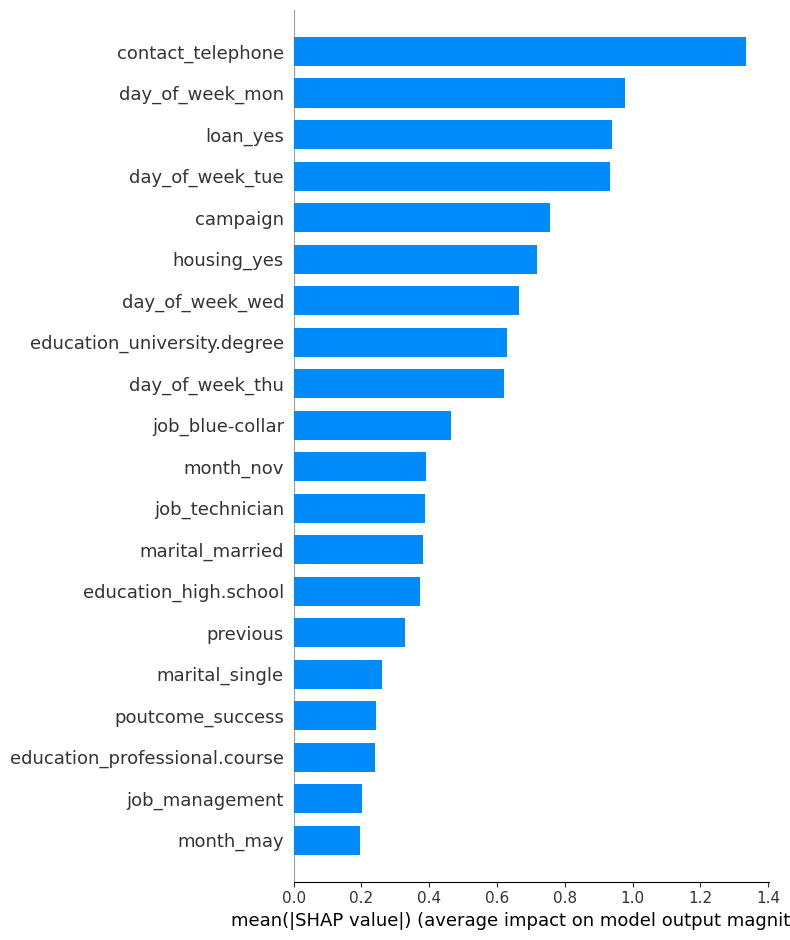

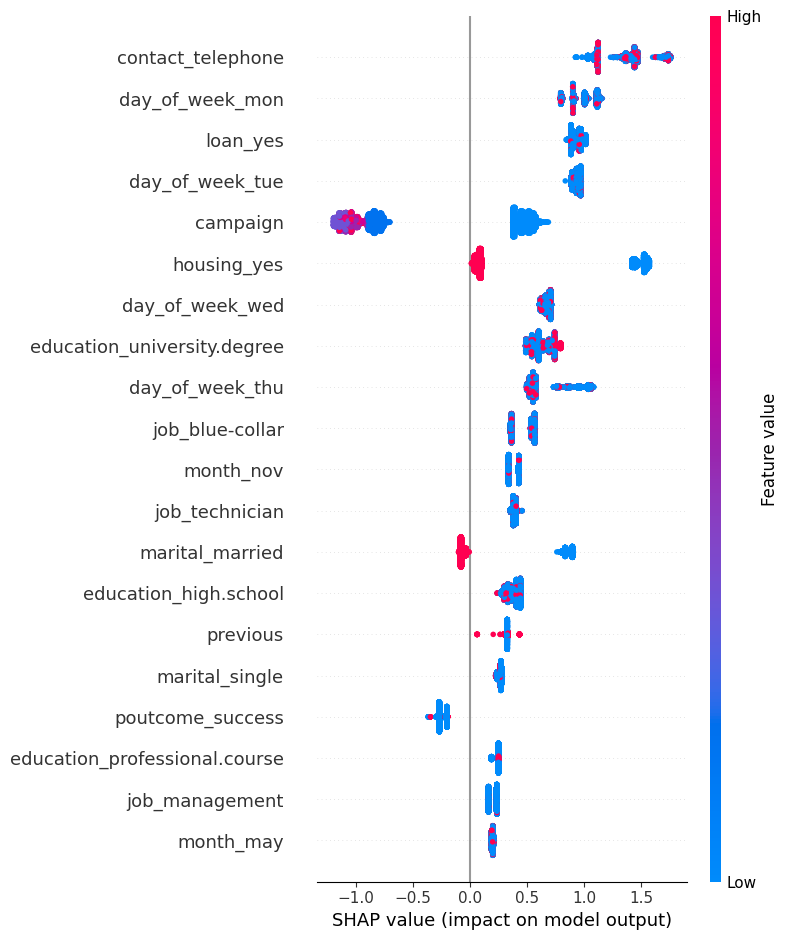

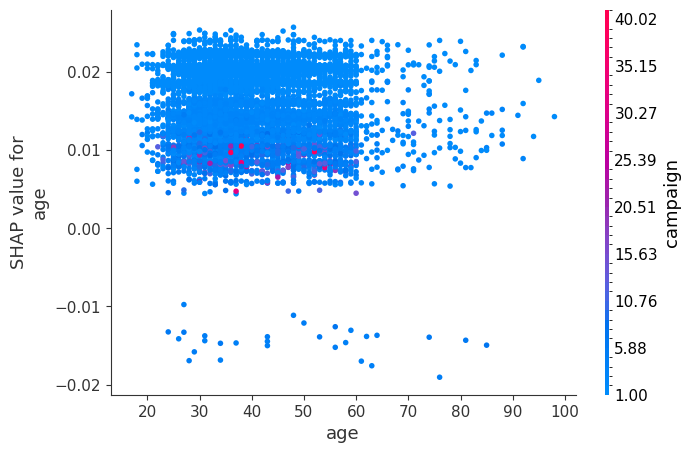

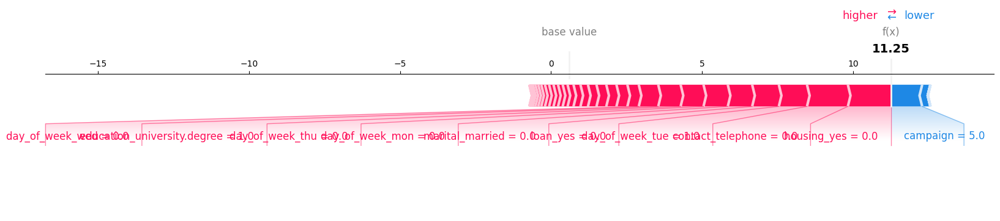

In [ ]:
# ==============================
# SHAP EXPLANATION (GBM FINAL)
# ==============================

print("\n--- SHAP EXPLANATION (GBM) ---")

import shap
import numpy as np

# Explainer
explainer = shap.TreeExplainer(best_gbm)

# SHAP values
shap_values = explainer.shap_values(X_test)

# ✅ Handle classification (binary)
if isinstance(shap_values, list):
    shap_values_class1 = shap_values[1]
else:
    shap_values_class1 = shap_values

# ✅ Ensure 2D
if len(shap_values_class1.shape) == 1:
    shap_values_class1 = shap_values_class1.reshape(1, -1)

# -------------------------------
# 1. GLOBAL FEATURE IMPORTANCE
# -------------------------------
shap.summary_plot(shap_values_class1, X_test, plot_type="bar")

# -------------------------------
# 2. DETAILED SUMMARY
# -------------------------------
shap.summary_plot(shap_values_class1, X_test)

# -------------------------------
# 3. DEPENDENCE PLOT
# -------------------------------
shap.dependence_plot(
    X_test.columns[0],
    shap_values_class1,
    X_test
)

# -------------------------------
# 4. LOCAL EXPLANATION (FORCE PLOT)
# -------------------------------
base_value = explainer.expected_value
if isinstance(base_value, list):
    base_value = base_value[1]

shap.force_plot(
    base_value,
    shap_values_class1[0],
    X_test.iloc[0],
    matplotlib=True
)

# **LIME EXPLANATION (GBM)**

In [ ]:
# ==============================
# LIME EXPLANATION (GBM)
# ==============================

# 🔥 Run once if not installed
# !pip install lime

print("\n--- LIME EXPLANATION (GBM) ---")

from lime.lime_tabular import LimeTabularExplainer
import numpy as np
import pandas as pd

# -------------------------------
# 1. Use SAME data format as training
# -------------------------------
X_train_np = np.array(X_train)   # or X_train_scaled if you used scaling
X_test_np  = np.array(X_test)

# -------------------------------
# 2. Create LIME Explainer
# -------------------------------
lime_explainer = LimeTabularExplainer(
    training_data=X_train_np,
    feature_names=X_train.columns,     # correct feature names
    class_names=['No', 'Yes'],         # ⚠️ adjust based on your model
    mode='classification'
)

# -------------------------------
# 3. Explain one instance
# -------------------------------
lime_exp = lime_explainer.explain_instance(
    X_test_np[0],                     # first test sample
    best_gbm.predict_proba,           # GBM model
    num_features=10
)

# -------------------------------
# 4. Show explanation
# -------------------------------
lime_exp.show_in_notebook(show_table=True)

# -------------------------------
# 5. Save output (optional)
# -------------------------------
lime_exp.save_to_file("lime_gbm.html")


--- LIME EXPLANATION (GBM) ---


# **Logistic Regression **


In [ ]:

# ==============================
# LOGISTIC REGRESSION TUNING
# ==============================
params_lr = {
    "C": [0.01, 0.1, 1, 10],
    "penalty": ["l1", "l2"]
}

rscv_lr = RandomizedSearchCV(
    LogisticRegression(max_iter=1000, solver='liblinear'),
    params_lr,
    n_iter=5,
    scoring='f1',
    cv=3,
    n_jobs=-1
)

rscv_lr.fit(X_train_ad, y_train_ad)

best_lr = rscv_lr.best_estimator_

In [ ]:
print("\n🔥 Logistic Regression (Tuned)")

y_pred_lr = best_lr.predict(X_test_scaled)
y_prob_lr = best_lr.predict_proba(X_test_scaled)[:,1]

compute_metrics(y_test, y_pred_lr, y_prob_lr)

print("Best Params (LR):", rscv_lr.best_params_)


🔥 Logistic Regression (Tuned)
Accuracy    : 0.7862
Precision   : 0.3047
Recall      : 0.7004
Specificity : 0.7971
F1 Score    : 0.4247
ROC-AUC     : 0.7980
MCC         : 0.3591
G-Mean      : 0.7472
Kappa       : 0.3176
Best Params (LR): {'penalty': 'l2', 'C': 0.1}


In [ ]:
results_lr = []

for fold, (train_idx, test_idx) in enumerate(skf.split(X, y)):

    X_train_f, X_test_f = X.iloc[train_idx], X.iloc[test_idx]
    y_train_f, y_test_f = y.iloc[train_idx], y.iloc[test_idx]

    # Scaling
    scaler = StandardScaler()
    X_train_f = scaler.fit_transform(X_train_f)
    X_test_f  = scaler.transform(X_test_f)

    # ADASYN
    adasyn = ADASYN(random_state=42)
    X_train_f, y_train_f = adasyn.fit_resample(X_train_f, y_train_f)

    # Train
    start_time = time.time()
    best_lr.fit(X_train_f, y_train_f)
    training_time = time.time() - start_time

    # Predict
    y_pred = best_lr.predict(X_test_f)
    y_prob = best_lr.predict_proba(X_test_f)[:,1]

    # Metrics
    acc = accuracy_score(y_test_f, y_pred)
    prec = precision_score(y_test_f, y_pred, zero_division=0)
    rec = recall_score(y_test_f, y_pred, zero_division=0)
    f1 = f1_score(y_test_f, y_pred, zero_division=0)

    tn, fp, fn, tp = confusion_matrix(y_test_f, y_pred).ravel()

    specificity = tn/(tn+fp)
    fpr = fp/(fp+tn)
    gm = np.sqrt(rec * specificity)

    auc = roc_auc_score(y_test_f, y_prob)
    mcc = matthews_corrcoef(y_test_f, y_pred)
    kappa = cohen_kappa_score(y_test_f, y_pred)
    balanced_acc = (rec + specificity)/2

    results_lr.append({
        "Fold": fold+1,
        "Classifier": "Logistic Regression",
        "Accuracy": acc,
        "Precision": prec,
        "Recall": rec,
        "Specificity": specificity,
        "F1": f1,
        "GM": gm,
        "FPR": fpr,
        "AUC": auc,
        "MCC": mcc,
        "Kappa": kappa,
        "Balanced Accuracy": balanced_acc,
        "Training Time (s)": training_time
    })


In [ ]:
#df_cat = pd.DataFrame(results1)
df_lr  = pd.DataFrame(results_lr)

final_df = pd.concat([ df_lr])

In [ ]:

print("\n===== Logistic Regression (Fold-wise) =====")
print(final_df.to_string(index=False))

print("\n===== AVERAGE COMPARISON =====")
print(final_df.groupby("Classifier").mean(numeric_only=True))


===== Logistic Regression (Fold-wise) =====
 Fold          Classifier  Accuracy  Precision   Recall  Specificity       F1       GM      FPR      AUC      MCC    Kappa  Balanced Accuracy  Training Time (s)
    1 Logistic Regression  0.778101   0.289720 0.668103     0.792066 0.404172 0.727449 0.207934 0.788897 0.331779 0.293079           0.730085           1.727304
    2 Logistic Regression  0.779315   0.289499 0.659483     0.794528 0.402367 0.723863 0.205472 0.779773 0.328646 0.291427           0.727005           1.576431
    3 Logistic Regression  0.774217   0.283457 0.657328     0.789056 0.396104 0.720186 0.210944 0.783070 0.321258 0.283281           0.723192           1.771653
    4 Logistic Regression  0.773731   0.284530 0.665948     0.787415 0.398710 0.724139 0.212585 0.785010 0.325310 0.286003           0.726681           1.647803
    5 Logistic Regression  0.788784   0.305927 0.689655     0.801368 0.423841 0.743416 0.198632 0.800135 0.356663 0.317293           0.745512         


--- SHAP EXPLANATION (LOGISTIC REGRESSION) ---


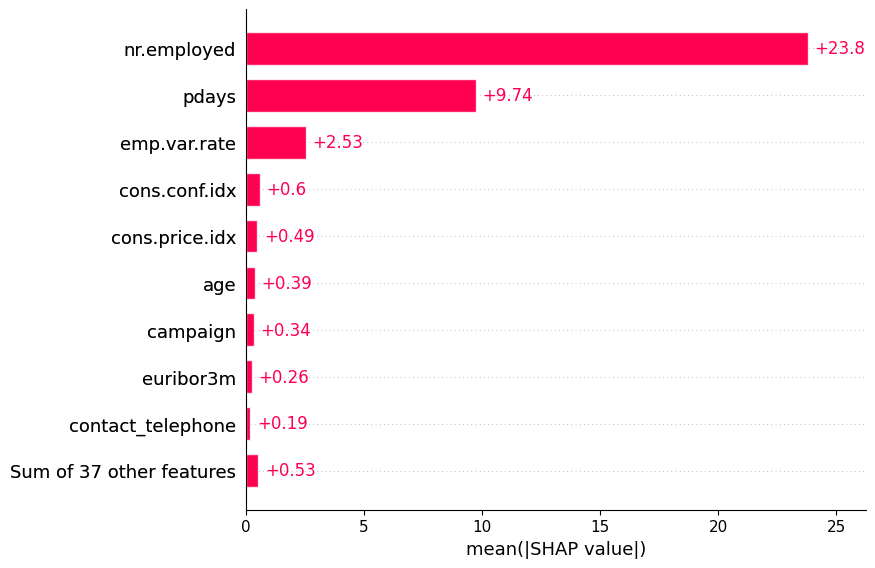

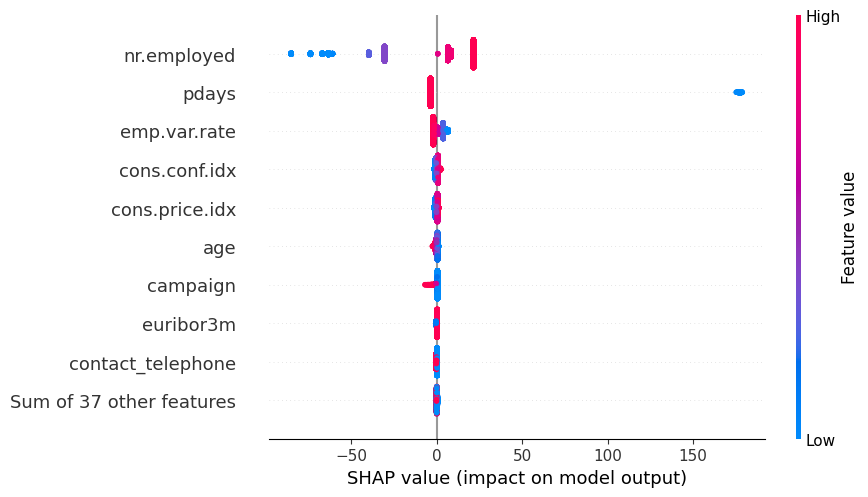

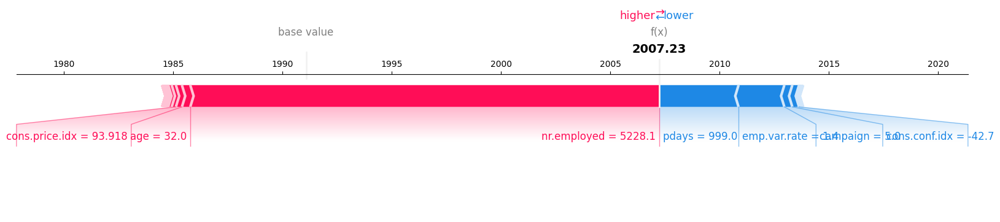

In [ ]:
# ==============================
# SHAP EXPLANATION (FINAL FIX)
# ==============================

import shap
import pandas as pd
import numpy as np

print("\n--- SHAP EXPLANATION (LOGISTIC REGRESSION) ---")

# -------------------------------
# SAFE DATA PREPARATION
# -------------------------------
X_test_df = pd.DataFrame(X_test, columns=X.columns)

# Ensure float type (IMPORTANT FIX)
X_test_df = X_test_df.astype(float)

# -------------------------------
# ✅ NEW SHAP EXPLAINER (FIX)
# -------------------------------
explainer = shap.Explainer(best_lr, X_test_df)

# This returns SHAP object (not raw array)
shap_values = explainer(X_test_df)

# -------------------------------
# GLOBAL IMPORTANCE
# -------------------------------
shap.plots.bar(shap_values)

# -------------------------------
# DETAILED SUMMARY
# -------------------------------
shap.plots.beeswarm(shap_values)

# -------------------------------
# -------------------------------
# FORCE PLOT (CORRECT)
# -------------------------------

shap.force_plot(
    shap_values.base_values[0],
    shap_values.values[0],
    X_test_df.iloc[0],
    matplotlib=True
)

In [ ]:
# ==============================
# LIME EXPLANATION (FINAL FIX)
# ==============================

from lime.lime_tabular import LimeTabularExplainer
import numpy as np
import pandas as pd

print("\n--- LIME EXPLANATION ---")

# -------------------------------
# ✅ ENSURE PROPER FORMAT
# -------------------------------
# Convert to DataFrame (important for feature names)
X_train_df = pd.DataFrame(X_train, columns=X.columns)
X_test_df  = pd.DataFrame(X_test,  columns=X.columns)

# Ensure numeric + no NaN
X_train_df = X_train_df.apply(pd.to_numeric, errors='coerce').fillna(0)
X_test_df  = X_test_df.apply(pd.to_numeric, errors='coerce').fillna(0)

# Convert to numpy (LIME needs numpy)
X_train_np = X_train_df.values.astype(float)
X_test_np  = X_test_df.values.astype(float)

# -------------------------------
# ✅ CREATE EXPLAINER
# -------------------------------
explainer = LimeTabularExplainer(
    training_data=X_train_np,
    feature_names=X.columns.tolist(),
    class_names=["Class 0", "Class 1"],   # adjust if needed
    mode="classification"
)

# -------------------------------
# ✅ EXPLAIN ONE INSTANCE
# -------------------------------
i = 0  # choose any test index

exp = explainer.explain_instance(
    X_test_np[i],
    best_lr.predict_proba,   # IMPORTANT: use predict_proba
    num_features=10
)

# -------------------------------
# ✅ DISPLAY OUTPUT
# -------------------------------
print("\n🔹 Prediction Probabilities:")
print(best_lr.predict_proba(X_test_np[i].reshape(1, -1)))

print("\n🔹 LIME Explanation:")
for feature, weight in exp.as_list():
    print(f"{feature}: {weight:.4f}")

# -------------------------------
# ✅ VISUAL OUTPUT (NOTEBOOK)
# -------------------------------
try:
    exp.show_in_notebook(show_table=True)
except:
    print("Notebook visualization not supported here.")

# -------------------------------
# ✅ SAVE HTML FILE
# -------------------------------
exp.save_to_file("/content/lime_explanation.html")

print("\n✅ LIME explanation saved as lime_explanation.html")


--- LIME EXPLANATION ---

🔹 Prediction Probabilities:
[[0. 1.]]

🔹 LIME Explanation:
age <= 32.00: 0.0000
campaign > 3.00: 0.0000
pdays <= 999.00: 0.0000
previous <= 0.00: 0.0000
1.10 < emp.var.rate <= 1.40: 0.0000
93.75 < cons.price.idx <= 93.99: 0.0000
cons.conf.idx <= -42.70: 0.0000
4.86 < euribor3m <= 4.96: 0.0000
5191.00 < nr.employed <= 5228.10: 0.0000
job_blue-collar <= 0.00: 0.0000



✅ LIME explanation saved as lime_explanation.html


# Random Forest

In [ ]:
#Import Random Forest
from sklearn.ensemble import RandomForestClassifier

In [ ]:
#Hyperparameter Tuning
# ==============================
# RANDOM FOREST TUNING
# ==============================
params_rf = {
    "n_estimators": [100, 200],
    "max_depth": [5, 10, None],
    "min_samples_split": [2, 5],
    "min_samples_leaf": [1, 2],
    "max_features": ["sqrt", "log2"]
}

rscv_rf = RandomizedSearchCV(
    RandomForestClassifier(random_state=42, class_weight="balanced"),
    params_rf,
    n_iter=5,
    scoring='f1',
    cv=3,
    n_jobs=-1
)

rscv_rf.fit(X_train_ad, y_train_ad)

best_rf = rscv_rf.best_estimator_

In [ ]:
#Test Performance
print("\n🌲 Random Forest (Tuned)")

y_pred_rf = best_rf.predict(X_test_scaled)
y_prob_rf = best_rf.predict_proba(X_test_scaled)[:,1]

compute_metrics(y_test, y_pred_rf, y_prob_rf)

print("Best Params (RF):", rscv_rf.best_params_)


🌲 Random Forest (Tuned)
Accuracy    : 0.3585
Precision   : 0.1416
Recall      : 0.9278
Specificity : 0.2862
F1 Score    : 0.2458
ROC-AUC     : 0.8073
MCC         : 0.1538
G-Mean      : 0.5153
Kappa       : 0.0625
Best Params (RF): {'n_estimators': 200, 'min_samples_split': 2, 'min_samples_leaf': 2, 'max_features': 'sqrt', 'max_depth': 10}


In [ ]:
#Cross Validation (Random Forest)
results_rf = []

for fold, (train_idx, test_idx) in enumerate(skf.split(X, y)):

    X_train_f, X_test_f = X.iloc[train_idx], X.iloc[test_idx]
    y_train_f, y_test_f = y.iloc[train_idx], y.iloc[test_idx]

    # Scaling (optional for RF, but keeping consistent)
    scaler = StandardScaler()
    X_train_f = scaler.fit_transform(X_train_f)
    X_test_f  = scaler.transform(X_test_f)

    # ADASYN
    adasyn = ADASYN(random_state=42)
    X_train_f, y_train_f = adasyn.fit_resample(X_train_f, y_train_f)

    # Train
    start_time = time.time()
    best_rf.fit(X_train_f, y_train_f)
    training_time = time.time() - start_time

    # Predict
    y_pred = best_rf.predict(X_test_f)
    y_prob = best_rf.predict_proba(X_test_f)[:,1]

    # Metrics
    acc = accuracy_score(y_test_f, y_pred)
    prec = precision_score(y_test_f, y_pred, zero_division=0)
    rec = recall_score(y_test_f, y_pred, zero_division=0)
    f1 = f1_score(y_test_f, y_pred, zero_division=0)

    tn, fp, fn, tp = confusion_matrix(y_test_f, y_pred).ravel()

    specificity = tn/(tn+fp)
    fpr = fp/(fp+tn)
    gm = np.sqrt(rec * specificity)

    auc = roc_auc_score(y_test_f, y_prob)
    mcc = matthews_corrcoef(y_test_f, y_pred)
    kappa = cohen_kappa_score(y_test_f, y_pred)
    balanced_acc = (rec + specificity)/2

    results_rf.append({
        "Fold": fold+1,
        "Classifier": "Random Forest",
        "Accuracy": acc,
        "Precision": prec,
        "Recall": rec,
        "Specificity": specificity,
        "F1": f1,
        "GM": gm,
        "FPR": fpr,
        "AUC": auc,
        "MCC": mcc,
        "Kappa": kappa,
        "Balanced Accuracy": balanced_acc,
        "Training Time (s)": training_time
    })

In [ ]:
df_rf  = pd.DataFrame(results_rf)

#final_df = pd.concat([df_cat, df_lr, df_dt, df_rf])

final_df = pd.concat([df_rf])


In [ ]:
print("\n===== Random Forest MODELS =====")
print(final_df.to_string(index=False))

print("\n===== AVERAGE COMPARISON =====")
print(final_df.groupby("Classifier").mean(numeric_only=True))


===== Random Forest MODELS =====
 Fold    Classifier  Accuracy  Precision   Recall  Specificity       F1       GM      FPR      AUC      MCC    Kappa  Balanced Accuracy  Training Time (s)
    1 Random Forest  0.866230   0.427621 0.553879     0.905882 0.482629 0.708343 0.094118 0.790656 0.411766 0.407270           0.729881          12.724925
    2 Random Forest  0.865987   0.426910 0.553879     0.905609 0.482176 0.708236 0.094391 0.779650 0.411237 0.406688           0.729744          12.440700
    3 Random Forest  0.865259   0.425287 0.558190     0.904241 0.482759 0.710449 0.095759 0.795099 0.411895 0.406921           0.731215          12.542233
    4 Random Forest  0.865744   0.428341 0.573276     0.902873 0.490323 0.719441 0.097127 0.781440 0.420716 0.414871           0.738074          13.094743
    5 Random Forest  0.874970   0.457429 0.590517     0.911081 0.515522 0.733491 0.088919 0.801094 0.449856 0.445071           0.750799          12.748417
    6 Random Forest  0.875212   0.45


--- SHAP EXPLANATION (Random Forest) ---


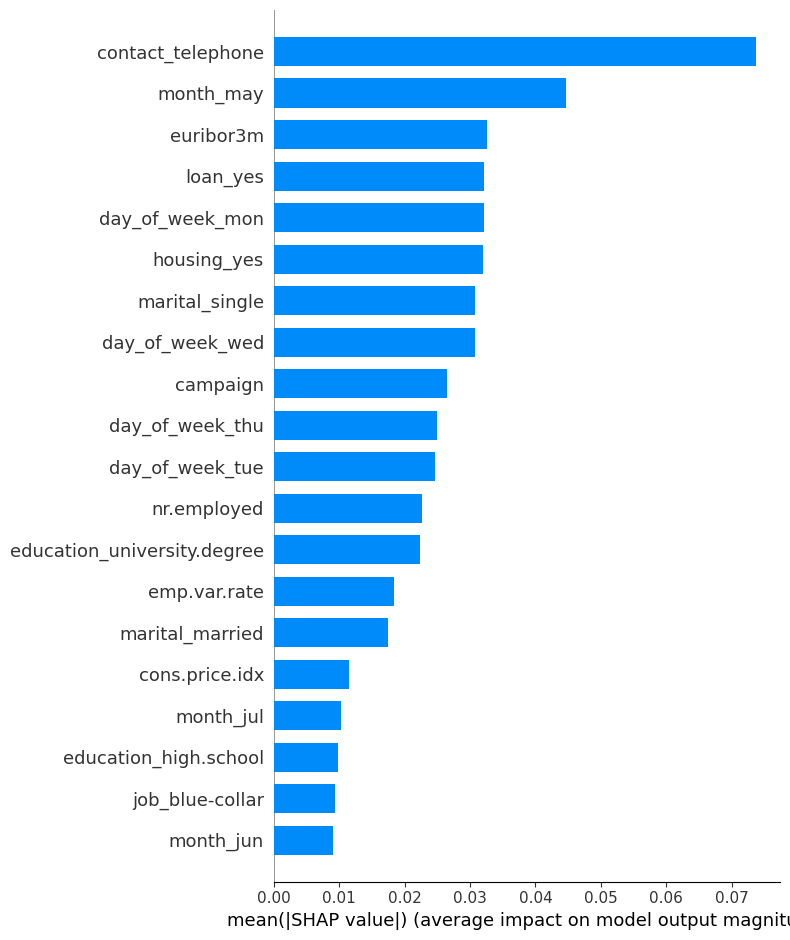

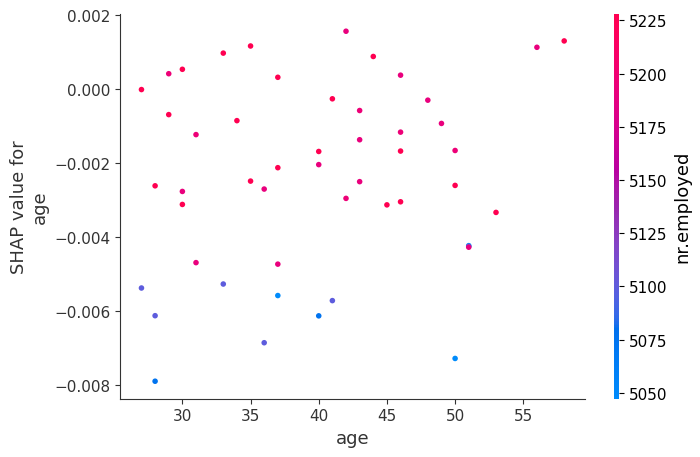

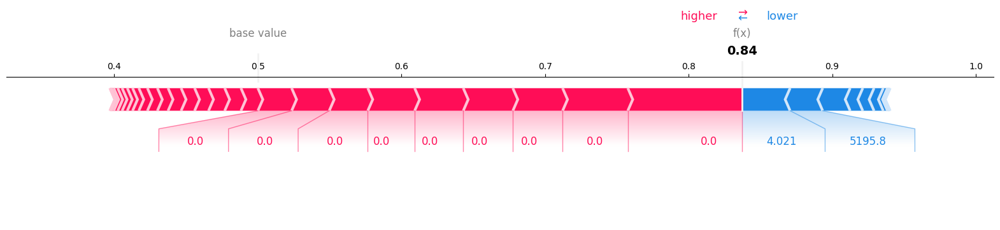

In [ ]:
# ==============================
# SHAP EXPLANATION (Random Forest FINAL)
# ==============================

print("\n--- SHAP EXPLANATION (Random Forest) ---")

import shap
import pandas as pd
import numpy as np

# -------------------------------
# 0. PREPARE DATA (IMPORTANT)
# -------------------------------
# Ensure DataFrame + correct feature names
X_test_df = pd.DataFrame(X_test, columns=X.columns).astype(float)

# 🔥 Use small sample (avoid slow / crash)
X_sample = X_test_df.sample(min(50, len(X_test_df)), random_state=42)

# -------------------------------
# 1. EXPLAINER (TREE MODEL)
# -------------------------------
explainer = shap.TreeExplainer(best_rf)

# -------------------------------
# 2. SHAP VALUES
# -------------------------------
shap_values = explainer.shap_values(X_sample)

# Handle binary classification properly
if isinstance(shap_values, list):
    shap_values_class1 = shap_values[1]
elif isinstance(shap_values, np.ndarray) and shap_values.ndim == 3:
    shap_values_class1 = shap_values[:, :, 1]
else:
    shap_values_class1 = shap_values

# -------------------------------
# 3. GLOBAL FEATURE IMPORTANCE
# -------------------------------
shap.summary_plot(shap_values_class1, X_sample, plot_type="bar")

# -------------------------------
# 4. DETAILED SUMMARY (optional)
# -------------------------------
# shap.summary_plot(shap_values_class1, X_sample)

# -------------------------------
# 5. DEPENDENCE PLOT (FIXED)
# -------------------------------
shap.dependence_plot(
    0,                      # use index instead of column name
    shap_values_class1,
    X_sample
)

# -------------------------------
# 6. LOCAL EXPLANATION (SAFE)
# -------------------------------
base_value = explainer.expected_value

# Fix base value shape
if isinstance(base_value, (list, np.ndarray)):
    base_value = base_value[1]

shap.force_plot(
    base_value,
    shap_values_class1[0],
    X_sample.iloc[0].values,   # 🔥 FIX
    matplotlib=True
)

In [ ]:
# ==============================
# LIME EXPLANATION (Random Forest - FINAL)
# ==============================

from lime.lime_tabular import LimeTabularExplainer
import numpy as np
import pandas as pd

print("\n--- LIME EXPLANATION (Random Forest) ---")

# -------------------------------
# ✅ PREPARE DATA (match training pipeline)
# -------------------------------
# If you scaled features for training, use the SAME scaled arrays here:
X_train_df = pd.DataFrame(X_train_f, columns=X.columns).astype(float)
X_test_df  = pd.DataFrame(X_test_f,  columns=X.columns).astype(float)

X_train_np = X_train_df.values
X_test_np  = X_test_df.values

# -------------------------------
# ✅ CREATE EXPLAINER
# -------------------------------
explainer = LimeTabularExplainer(
    training_data=X_train_np,
    feature_names=X.columns.tolist(),
    class_names=["Class 0", "Class 1"],   # adjust labels if needed
    mode="classification",
    discretize_continuous=True
)

# -------------------------------
# ✅ EXPLAIN ONE INSTANCE
# -------------------------------
i = 0  # choose any test index

exp = explainer.explain_instance(
    X_test_np[i],
    best_rf.predict_proba,     # IMPORTANT
    num_features=10
)

# -------------------------------
# ✅ OUTPUT (TEXT)
# -------------------------------
print("\n🔹 Prediction Probabilities:")
print(best_rf.predict_proba(X_test_np[i].reshape(1, -1)))

print("\n🔹 LIME Explanation:")
for feat, w in exp.as_list():
    print(f"{feat}: {w:.4f}")

# -------------------------------
# ✅ VISUAL (if notebook)
# -------------------------------
try:
    exp.show_in_notebook(show_table=True)
except:
    print("Notebook visualization not supported here.")

# -------------------------------
# ✅ SAVE HTML
# -------------------------------
exp.save_to_file("/content/lime_rf_explanation.html")
print("\n📁 Saved: /content/lime_rf_explanation.html")


--- LIME EXPLANATION (Random Forest) ---

🔹 Prediction Probabilities:
[[0.90540548 0.09459452]]

🔹 LIME Explanation:
-0.11 < emp.var.rate <= 0.84: -0.0437
0.29 < euribor3m <= 0.77: -0.0193
job_entrepreneur <= -0.19: 0.0106
-0.94 < nr.employed <= 0.33: 0.0070
campaign <= -0.57: 0.0069
job_self-employed <= -0.19: 0.0056
job_housemaid <= -0.16: 0.0042
-0.76 < contact_telephone <= 1.32: -0.0040
job_services <= -0.33: 0.0039
job_student <= -0.15: 0.0037



📁 Saved: /content/lime_rf_explanation.html


# **Decision Tree**

In [17]:
from sklearn.tree import DecisionTreeClassifier

In [18]:
# ==============================
# DECISION TREE TUNING
# ==============================
params_dt = {
    "max_depth": [3, 5, 10, None],
    "min_samples_split": [2, 5, 10],
    "min_samples_leaf": [1, 2, 4],
    "criterion": ["gini", "entropy"]
}

rscv_dt = RandomizedSearchCV(
    DecisionTreeClassifier(random_state=42),
    params_dt,
    n_iter=2,
    scoring='f1',
    cv=3,
    n_jobs=-1
)

rscv_dt.fit(X_train_ad, y_train_ad)

best_dt = rscv_dt.best_estimator_

In [19]:
print("\n🌳 Decision Tree (Tuned)")

y_pred_dt = best_dt.predict(X_test_scaled)
y_prob_dt = best_dt.predict_proba(X_test_scaled)[:,1]

compute_metrics(y_test, y_pred_dt, y_prob_dt)

print("Best Params (DT):", rscv_dt.best_params_)


🌳 Decision Tree (Tuned)
Accuracy    : 0.9984
Precision   : 0.9864
Recall      : 1.0000
Specificity : 0.9982
F1 Score    : 0.9932
ROC-AUC     : 0.9994
MCC         : 0.9923
G-Mean      : 0.9991
Kappa       : 0.9923
Best Params (DT): {'min_samples_split': 5, 'min_samples_leaf': 2, 'max_depth': 5, 'criterion': 'gini'}


In [20]:
#Cross Validation (Decision Tree)

results_dt = []

for fold, (train_idx, test_idx) in enumerate(skf.split(X, y)):

    X_train_f, X_test_f = X.iloc[train_idx], X.iloc[test_idx]
    y_train_f, y_test_f = y.iloc[train_idx], y.iloc[test_idx]

    # Scaling
    scaler = StandardScaler()
    X_train_f = scaler.fit_transform(X_train_f)
    X_test_f  = scaler.transform(X_test_f)

    # ADASYN
    adasyn = ADASYN(random_state=42)
    X_train_f, y_train_f = adasyn.fit_resample(X_train_f, y_train_f)

    # Train
    start_time = time.time()
    best_dt.fit(X_train_f, y_train_f)
    training_time = time.time() - start_time

    # Predict
    y_pred = best_dt.predict(X_test_f)
    y_prob = best_dt.predict_proba(X_test_f)[:,1]

    # Metrics
    acc = accuracy_score(y_test_f, y_pred)
    prec = precision_score(y_test_f, y_pred, zero_division=0)
    rec = recall_score(y_test_f, y_pred, zero_division=0)
    f1 = f1_score(y_test_f, y_pred, zero_division=0)

    tn, fp, fn, tp = confusion_matrix(y_test_f, y_pred).ravel()

    specificity = tn/(tn+fp)
    fpr = fp/(fp+tn)
    gm = np.sqrt(rec * specificity)

    auc = roc_auc_score(y_test_f, y_prob)
    mcc = matthews_corrcoef(y_test_f, y_pred)
    kappa = cohen_kappa_score(y_test_f, y_pred)
    balanced_acc = (rec + specificity)/2

    results_dt.append({
        "Fold": fold+1,
        "Classifier": "Decision Tree",
        "Accuracy": acc,
        "Precision": prec,
        "Recall": rec,
        "Specificity": specificity,
        "F1": f1,
        "GM": gm,
        "FPR": fpr,
        "AUC": auc,
        "MCC": mcc,
        "Kappa": kappa,
        "Balanced Accuracy": balanced_acc,
        "Training Time (s)": training_time
    })

In [21]:
#All Model
#df_cat = pd.DataFrame(results1)
#df_lr  = pd.DataFrame(results_lr)
df_dt  = pd.DataFrame(results_dt)

final_df = pd.concat([ df_dt])

In [22]:
#Print Comparison
print("\n===== Decision Tree MODELS =====")
print(final_df.to_string(index=False))

print("\n===== AVERAGE COMPARISON =====")
print(final_df.groupby("Classifier").mean(numeric_only=True))


===== Decision Tree MODELS =====
 Fold    Classifier  Accuracy  Precision  Recall  Specificity       F1       GM      FPR      AUC      MCC    Kappa  Balanced Accuracy  Training Time (s)
    1 Decision Tree  0.998464   0.986680  1.0000     0.998266 0.993295 0.999133 0.001734 0.999307 0.992456 0.992428           0.999133          18.428223
    2 Decision Tree  0.998862   0.990099  1.0000     0.998716 0.995025 0.999358 0.001284 0.999441 0.994398 0.994382           0.999358           8.933264
    3 Decision Tree  0.998748   0.989120  1.0000     0.998587 0.994530 0.999293 0.001413 0.999354 0.993842 0.993823           0.999294           8.235432
    4 Decision Tree  0.999033   0.991572  1.0000     0.998908 0.995768 0.999454 0.001092 0.999665 0.995233 0.995222           0.999454           8.362354
    5 Decision Tree  0.998919   0.991076  0.9995     0.998844 0.995270 0.999172 0.001156 0.999381 0.994671 0.994660           0.999172           7.779098
    6 Decision Tree  0.998520   0.987167  


--- SHAP EXPLANATION (Decision Tree) ---


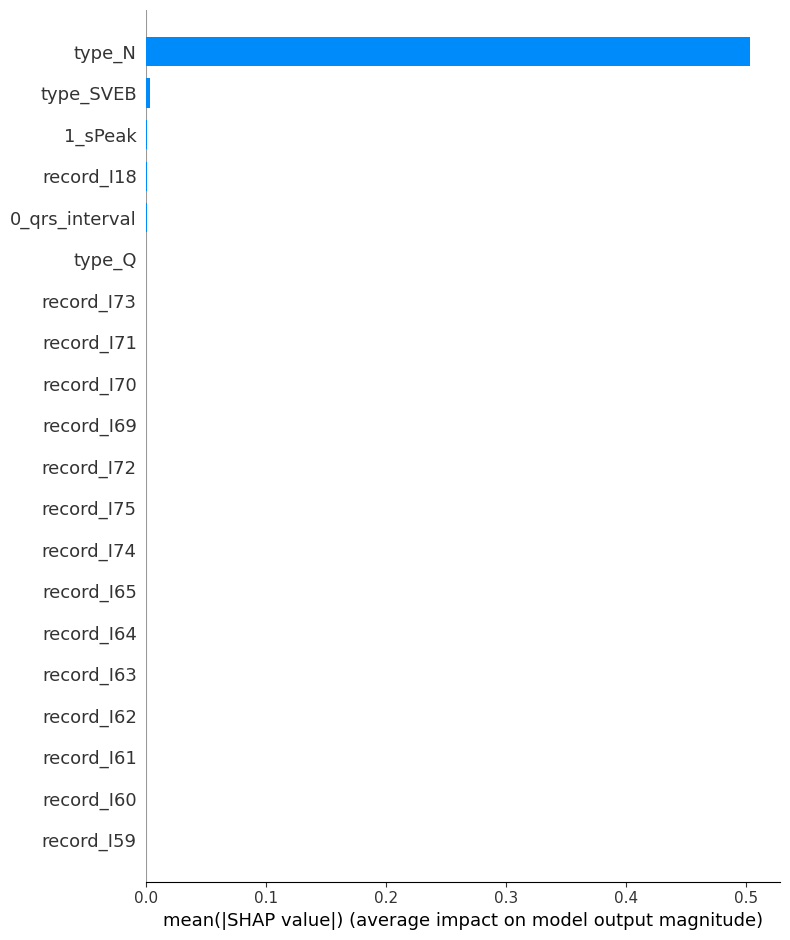

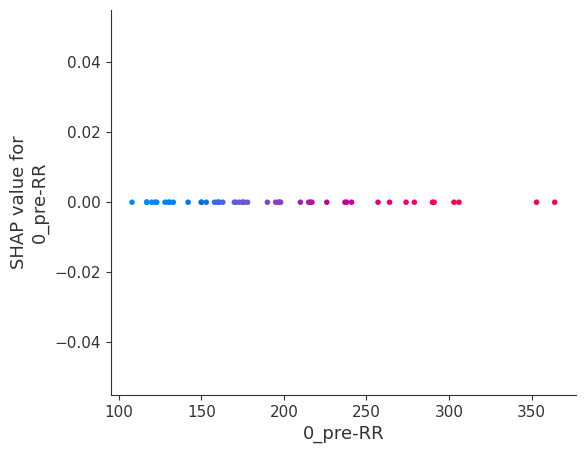

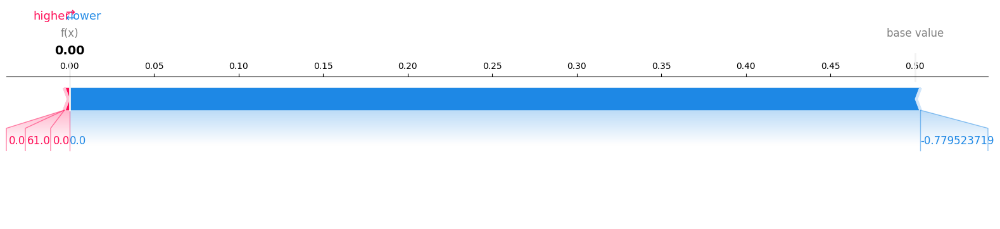

In [23]:
# ==============================
# SHAP EXPLANATION (Decision Tree FINAL)
# ==============================

print("\n--- SHAP EXPLANATION (Decision Tree) ---")

import shap
import pandas as pd
import numpy as np

# -------------------------------
# 0. PREPARE DATA
# -------------------------------
X_test_df = pd.DataFrame(X_test, columns=X.columns).astype(float)

# 🔥 Use small sample (important for speed)
X_sample = X_test_df.sample(min(50, len(X_test_df)), random_state=42)

# -------------------------------
# 1. EXPLAINER (TREE MODEL)
# -------------------------------
explainer = shap.TreeExplainer(best_dt)   # ← Decision Tree model

# -------------------------------
# 2. SHAP VALUES
# -------------------------------
shap_values = explainer.shap_values(X_sample)

# Handle classification output
if isinstance(shap_values, list):
    shap_values_class1 = shap_values[1]
elif isinstance(shap_values, np.ndarray) and shap_values.ndim == 3:
    shap_values_class1 = shap_values[:, :, 1]
else:
    shap_values_class1 = shap_values

# -------------------------------
# 3. GLOBAL FEATURE IMPORTANCE
# -------------------------------
shap.summary_plot(shap_values_class1, X_sample, plot_type="bar")

# -------------------------------
# 4. DEPENDENCE PLOT (SAFE)
# -------------------------------
shap.dependence_plot(
    0,                     # feature index (safe)
    shap_values_class1,
    X_sample
)

# -------------------------------
# 5. LOCAL EXPLANATION
# -------------------------------
base_value = explainer.expected_value

# Fix base value
if isinstance(base_value, (list, np.ndarray)):
    base_value = base_value[1]

shap.force_plot(
    base_value,
    shap_values_class1[0],
    X_sample.iloc[0].values,
    matplotlib=True
)

# **LightGBM**

In [ ]:

from lightgbm import LGBMClassifier

In [ ]:

# ==============================
# LIGHTGBM TUNING
# ==============================
params_lgb = {
    "n_estimators": [100, 200],
    "learning_rate": [0.05, 0.1],
    "num_leaves": [31, 50],
    "max_depth": [-1, 10],
    "subsample": [0.8, 1.0],
    "colsample_bytree": [0.8, 1.0]
}

rscv_lgb = RandomizedSearchCV(
    LGBMClassifier(class_weight='balanced'),
    params_lgb,
    n_iter=10,
    scoring='f1',
    cv=3,
    n_jobs=-1
)

rscv_lgb.fit(X_train_ad, y_train_ad)

best_lgb = rscv_lgb.best_estimator_

# **K Nearest Neighbour **

In [24]:
from sklearn.neighbors import KNeighborsClassifier

In [26]:
# ==============================
# KNN TUNING
# ==============================
params_knn = {
    "n_neighbors": [3, 5, 7, 9],
    "weights": ["uniform", "distance"],
    "metric": ["euclidean", "manhattan"]
}

rscv_knn = RandomizedSearchCV(
    KNeighborsClassifier(),
    params_knn,
    n_iter=2,
    scoring='f1',
    cv=3,
    n_jobs=-1
)

rscv_knn.fit(X_train_ad, y_train_ad)

best_knn = rscv_knn.best_estimator_

KeyboardInterrupt: 

In [ ]:
print("\n KNN (Tuned)")

y_pred_knn = best_knn.predict(X_test_scaled)
y_prob_knn = best_knn.predict_proba(X_test_scaled)[:,1]

compute_metrics(y_test, y_pred_knn, y_prob_knn)

print("Best Params (KNN):", rscv_knn.best_params_)

In [ ]:
results_knn = []

for fold, (train_idx, test_idx) in enumerate(skf.split(X, y)):

    X_train_f, X_test_f = X.iloc[train_idx], X.iloc[test_idx]
    y_train_f, y_test_f = y.iloc[train_idx], y.iloc[test_idx]

    # Scaling (VERY IMPORTANT for KNN ⚠️)
    scaler = StandardScaler()
    X_train_f = scaler.fit_transform(X_train_f)
    X_test_f  = scaler.transform(X_test_f)

    # ADASYN
    adasyn = ADASYN(random_state=42)
    X_train_f, y_train_f = adasyn.fit_resample(X_train_f, y_train_f)

    # Train
    start_time = time.time()
    best_knn.fit(X_train_f, y_train_f)
    training_time = time.time() - start_time

    # Predict
    y_pred = best_knn.predict(X_test_f)
    y_prob = best_knn.predict_proba(X_test_f)[:,1]

    # Metrics
    acc = accuracy_score(y_test_f, y_pred)
    prec = precision_score(y_test_f, y_pred, zero_division=0)
    rec = recall_score(y_test_f, y_pred, zero_division=0)
    f1 = f1_score(y_test_f, y_pred, zero_division=0)

    tn, fp, fn, tp = confusion_matrix(y_test_f, y_pred).ravel()

    specificity = tn/(tn+fp)
    fpr = fp/(fp+tn)
    gm = np.sqrt(rec * specificity)

    auc = roc_auc_score(y_test_f, y_prob)
    mcc = matthews_corrcoef(y_test_f, y_pred)
    kappa = cohen_kappa_score(y_test_f, y_pred)
    balanced_acc = (rec + specificity)/2

    results_knn.append({
        "Fold": fold+1,
        "Classifier": "KNN",
        "Accuracy": acc,
        "Precision": prec,
        "Recall": rec,
        "Specificity": specificity,
        "F1": f1,
        "GM": gm,
        "FPR": fpr,
        "AUC": auc,
        "MCC": mcc,
        "Kappa": kappa,
        "Balanced Accuracy": balanced_acc,
        "Training Time (s)": training_time
    })

In [ ]:
df_knn = pd.DataFrame(results_knn)

final_df = pd.concat([df_knn])

In [ ]:
print("\n===== KNN MODELS =====")
print(final_df.to_string(index=False))

print("\n===== AVERAGE COMPARISON =====")
print(final_df.groupby("Classifier").mean(numeric_only=True))


===== KNN MODELS =====
 Fold Classifier  Accuracy  Precision   Recall  Specificity       F1       GM      FPR      AUC      MCC    Kappa  Balanced Accuracy  Training Time (s)
    1        KNN  0.809663   0.295918 0.500000     0.848974 0.371795 0.651527 0.151026 0.709834 0.281054 0.268225           0.674487           0.004740
    2        KNN  0.809663   0.290576 0.478448     0.851710 0.361564 0.638357 0.148290 0.702251 0.268554 0.257486           0.665079           0.004456
    3        KNN  0.804564   0.274769 0.448276     0.849795 0.340704 0.617205 0.150205 0.698360 0.243318 0.233662           0.649035           0.006105
    4        KNN  0.812819   0.297760 0.487069     0.854172 0.369583 0.645012 0.145828 0.710235 0.278275 0.267110           0.670621           0.004543
    5        KNN  0.815732   0.310655 0.521552     0.853078 0.389381 0.667026 0.146922 0.732111 0.302457 0.288989           0.687315           0.004679
    6        KNN  0.813061   0.303846 0.510776     0.851436 0.38


--- SHAP EXPLANATION (KNN FINAL - FIXED) ---


  0%|          | 0/5 [00:00<?, ?it/s]

SHAP shape: (5, 46)
X_sample shape: (5, 46)


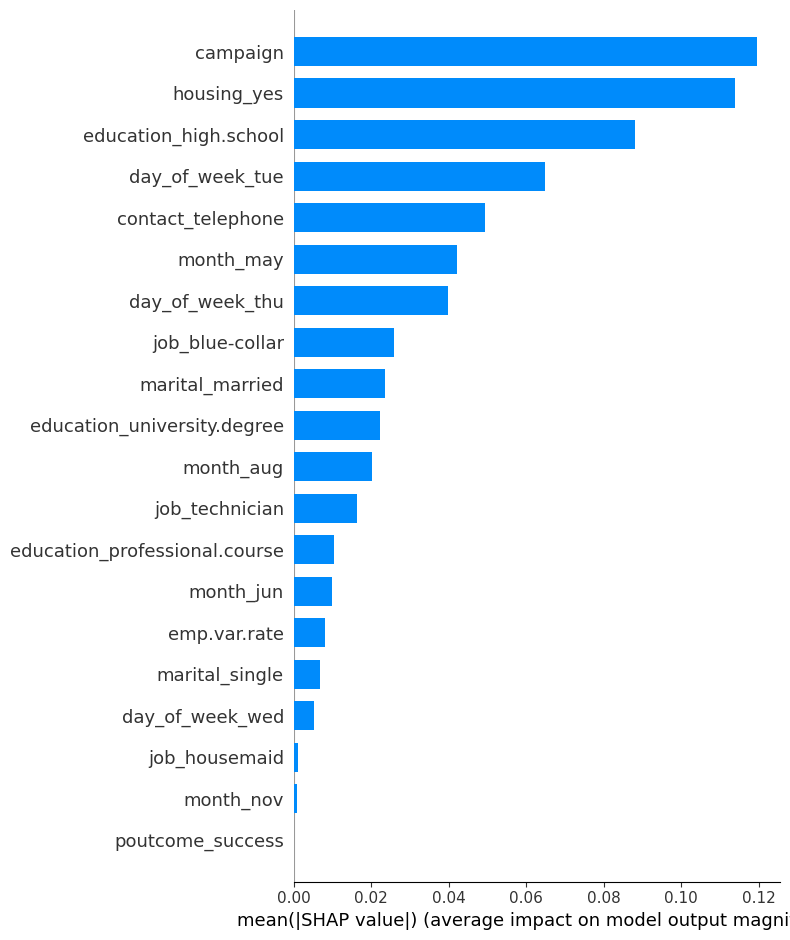

Single SHAP: (46,)
Single sample: (46,)


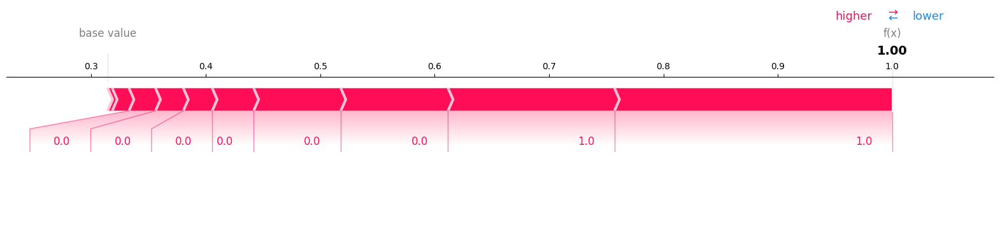

In [ ]:
print("\n--- SHAP EXPLANATION (KNN FINAL - FIXED) ---")

import shap
import numpy as np
import pandas as pd

# -------------------------------
# STEP 1: Prepare Data
# -------------------------------
feature_names = X.columns.tolist()

X_train_df = pd.DataFrame(X_train, columns=feature_names).astype(float)
X_test_df  = pd.DataFrame(X_test,  columns=feature_names).astype(float)

# -------------------------------
# STEP 2: Speed Control
# -------------------------------
X_background = X_train_df.sample(10, random_state=42)
X_sample     = X_test_df.sample(5, random_state=42)

# -------------------------------
# STEP 3: SHAP Explainer
# -------------------------------
explainer = shap.KernelExplainer(
    best_knn.predict_proba,
    X_background
)

# -------------------------------
# STEP 4: SHAP Values
# -------------------------------
shap_values = explainer.shap_values(X_sample)

# -------------------------------
# STEP 5: FIX SHAPE (IMPORTANT)
# -------------------------------
if isinstance(shap_values, list):
    shap_vals = shap_values[1]               # class 1
    base_val  = explainer.expected_value[1]
else:
    if len(shap_values.shape) == 3:
        shap_vals = shap_values[:, :, 1]
        base_val  = explainer.expected_value[1]
    else:
        shap_vals = shap_values
        base_val  = explainer.expected_value

# Ensure scalar base value
if isinstance(base_val, (list, np.ndarray)):
    base_val = float(np.array(base_val).flatten()[0])

# Debug check (optional)
print("SHAP shape:", shap_vals.shape)
print("X_sample shape:", X_sample.shape)

# -------------------------------
# STEP 6: GLOBAL IMPORTANCE
# -------------------------------
shap.summary_plot(shap_vals, X_sample, plot_type="bar")

# -------------------------------
# STEP 7: FORCE PLOT (SAFE)
# -------------------------------
sample = X_sample.iloc[0]
shap_val = shap_vals[0]

# Ensure correct shape
shap_val = np.array(shap_val).reshape(-1)
sample_vals = sample.values.reshape(-1)

print("Single SHAP:", shap_val.shape)
print("Single sample:", sample_vals.shape)

shap.force_plot(
    base_val,
    shap_val,
    sample_vals,
    matplotlib=True
)

In [ ]:
# ==============================
# LIME EXPLANATION (KNN FINAL)
# ==============================

from lime.lime_tabular import LimeTabularExplainer
import numpy as np
import pandas as pd

print("\n--- LIME EXPLANATION (KNN) ---")

# -------------------------------
# 0. PREPARE DATA (match training pipeline)
# -------------------------------
# If you scaled before training KNN, use the SAME scaled arrays here
X_train_df = pd.DataFrame(X_train, columns=X.columns).astype(float)
X_test_df  = pd.DataFrame(X_test,  columns=X.columns).astype(float)

# Ensure no NaN
X_train_df = X_train_df.fillna(0)
X_test_df  = X_test_df.fillna(0)

X_train_np = X_train_df.values
X_test_np  = X_test_df.values

# -------------------------------
# 1. CREATE EXPLAINER
# -------------------------------
explainer = LimeTabularExplainer(
    training_data=X_train_np,
    feature_names=X.columns.tolist(),
    class_names=["Class 0", "Class 1"],  # adjust if needed
    mode="classification",
    discretize_continuous=True
)

# -------------------------------
# 2. EXPLAIN ONE INSTANCE
# -------------------------------
i = 0  # choose any test index

exp = explainer.explain_instance(
    X_test_np[i],
    best_knn.predict_proba,     # IMPORTANT
    num_features=10
)

# -------------------------------
# 3. OUTPUT (TEXT)
# -------------------------------
print("\n🔹 Prediction Probabilities:")
print(best_knn.predict_proba(X_test_np[i].reshape(1, -1)))

print("\n🔹 LIME Explanation:")
for feat, w in exp.as_list():
    print(f"{feat}: {w:.4f}")

# -------------------------------
# 4. VISUAL (NOTEBOOK)
# -------------------------------
try:
    exp.show_in_notebook(show_table=True)
except:
    print("Notebook visualization not supported here.")

# -------------------------------
# 5. SAVE HTML
# -------------------------------
exp.save_to_file("/content/lime_knn_explanation.html")
print("\n📁 Saved: /content/lime_knn_explanation.html")


--- LIME EXPLANATION (KNN) ---

🔹 Prediction Probabilities:
[[0.14283493 0.85716507]]

🔹 LIME Explanation:
campaign > 3.00: -0.2929
housing_yes <= 0.00: 0.2447
0.00 < education_university.degree <= 1.00: -0.2086
education_illiterate <= 0.00: 0.1812
marital_married <= 0.00: 0.1296
month_dec <= 0.00: 0.0949
day_of_week_tue > 0.00: -0.0775
month_may <= 0.00: 0.0685
month_jul > 0.00: -0.0508
job_management > 0.00: 0.0423



📁 Saved: /content/lime_knn_explanation.html


# ** Multi Layer Perceptron**

In [ ]:
from sklearn.neural_network import MLPClassifier

In [ ]:
from sklearn.neural_network import MLPClassifier
from sklearn.model_selection import RandomizedSearchCV

params_mlp = {
    "hidden_layer_sizes": [(50,), (100,)],   # reduced
    "alpha": [0.0001, 0.001],
    "activation": ["relu"],                  # faster + usually best
}

mlp = MLPClassifier(
    max_iter=150,            # lower
    early_stopping=True,     # HUGE speed boost
    n_iter_no_change=5,
    solver='adam',           # fastest solver
    random_state=42
)

rscv_mlp = RandomizedSearchCV(
    mlp,
    params_mlp,
    n_iter=3,                # reduced
    scoring='f1',
    cv=2,                    # reduced folds
    n_jobs=-1,
    verbose=1
)

rscv_mlp.fit(X_train_ad, y_train_ad)

best_mlp = rscv_mlp.best_estimator_

Fitting 2 folds for each of 3 candidates, totalling 6 fits


In [ ]:
print("\n MLP (Tuned)")

y_pred_mlp = best_mlp.predict(X_test_scaled)
y_prob_mlp = best_mlp.predict_proba(X_test_scaled)[:,1]

compute_metrics(y_test, y_pred_mlp, y_prob_mlp)

print("Best Params (MLP):", rscv_mlp.best_params_)


 MLP (Tuned)
Accuracy    : 0.8244
Precision   : 0.3088
Recall      : 0.4515
Specificity : 0.8717
F1 Score    : 0.3667
ROC-AUC     : 0.7178
MCC         : 0.2755
G-Mean      : 0.6274
Kappa       : 0.2689
Best Params (MLP): {'hidden_layer_sizes': (100,), 'alpha': 0.001, 'activation': 'relu'}


In [ ]:
results_mlp = []

for fold, (train_idx, test_idx) in enumerate(skf.split(X, y)):

    X_train_f, X_test_f = X.iloc[train_idx], X.iloc[test_idx]
    y_train_f, y_test_f = y.iloc[train_idx], y.iloc[test_idx]

    # Scaling (VERY IMPORTANT for MLP ⚠️)
    scaler = StandardScaler()
    X_train_f = scaler.fit_transform(X_train_f)
    X_test_f  = scaler.transform(X_test_f)

    # ADASYN
    adasyn = ADASYN(random_state=42)
    X_train_f, y_train_f = adasyn.fit_resample(X_train_f, y_train_f)

    # Train
    start_time = time.time()
    best_mlp.fit(X_train_f, y_train_f)
    training_time = time.time() - start_time

    # Predict
    y_pred = best_mlp.predict(X_test_f)
    y_prob = best_mlp.predict_proba(X_test_f)[:,1]

    # Metrics
    acc = accuracy_score(y_test_f, y_pred)
    prec = precision_score(y_test_f, y_pred, zero_division=0)
    rec = recall_score(y_test_f, y_pred, zero_division=0)
    f1 = f1_score(y_test_f, y_pred, zero_division=0)

    tn, fp, fn, tp = confusion_matrix(y_test_f, y_pred).ravel()

    specificity = tn/(tn+fp)
    fpr = fp/(fp+tn)
    gm = np.sqrt(rec * specificity)

    auc = roc_auc_score(y_test_f, y_prob)
    mcc = matthews_corrcoef(y_test_f, y_pred)
    kappa = cohen_kappa_score(y_test_f, y_pred)
    balanced_acc = (rec + specificity)/2

    results_mlp.append({
        "Fold": fold+1,
        "Classifier": "MLP",
        "Accuracy": acc,
        "Precision": prec,
        "Recall": rec,
        "Specificity": specificity,
        "F1": f1,
        "GM": gm,
        "FPR": fpr,
        "AUC": auc,
        "MCC": mcc,
        "Kappa": kappa,
        "Balanced Accuracy": balanced_acc,
        "Training Time (s)": training_time
    })

In [ ]:
df_mlp = pd.DataFrame(results_mlp)

final_df = pd.concat([ df_mlp])

In [ ]:
print("\n===== MLP MODELS =====")
print(final_df.to_string(index=False))

print("\n===== AVERAGE COMPARISON =====")
print(final_df.groupby("Classifier").mean(numeric_only=True))


===== MLP MODELS =====
 Fold Classifier  Accuracy  Precision   Recall  Specificity       F1       GM      FPR      AUC      MCC    Kappa  Balanced Accuracy  Training Time (s)
    1        MLP  0.810876   0.287449 0.459052     0.855540 0.353527 0.626688 0.144460 0.707126 0.258947 0.249558           0.657296          25.995256
    2        MLP  0.827385   0.304279 0.413793     0.879891 0.350685 0.603401 0.120109 0.699607 0.257798 0.253808           0.646842          30.027397
    3        MLP  0.827628   0.297030 0.387931     0.883447 0.336449 0.585420 0.116553 0.708555 0.242216 0.239397           0.635689          25.334044
    4        MLP  0.827143   0.310398 0.437500     0.876607 0.363148 0.619286 0.123393 0.694624 0.271732 0.266475           0.657054          26.925996
    5        MLP  0.831513   0.340720 0.530172     0.869767 0.414840 0.679063 0.130233 0.746028 0.332568 0.321825           0.699970          22.784133
    6        MLP  0.815004   0.310433 0.525862     0.851710 0.39


--- SHAP EXPLANATION (MLP FINAL - ERROR FREE) ---


  0%|          | 0/5 [00:00<?, ?it/s]

SHAP shape: (5, 46)
X_sample shape: (5, 46)


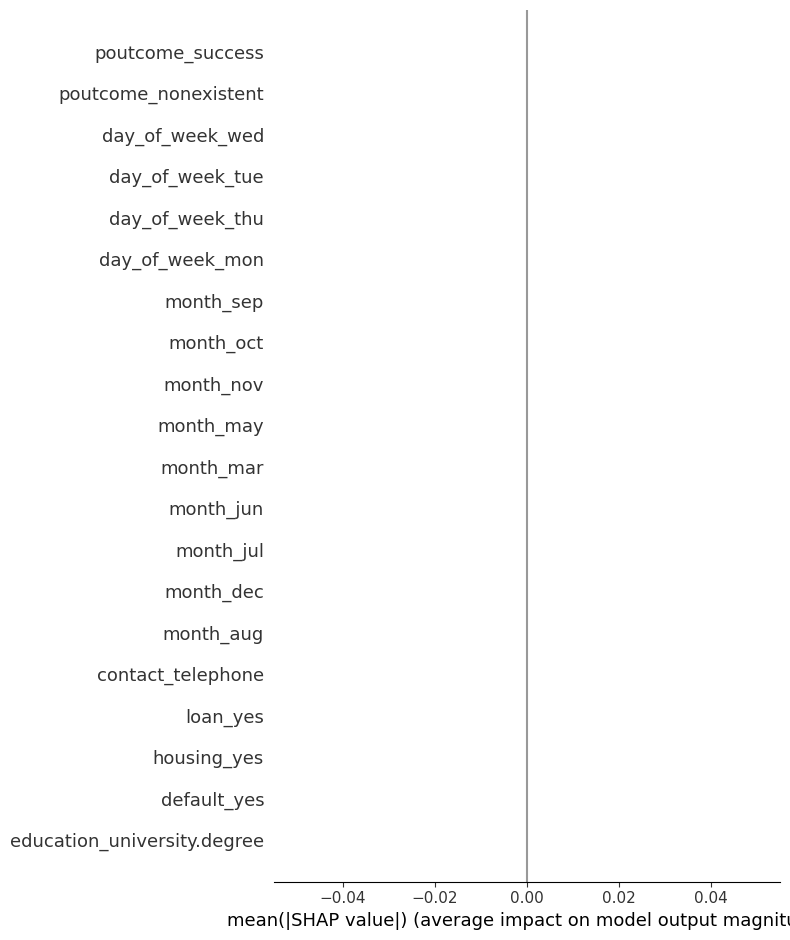

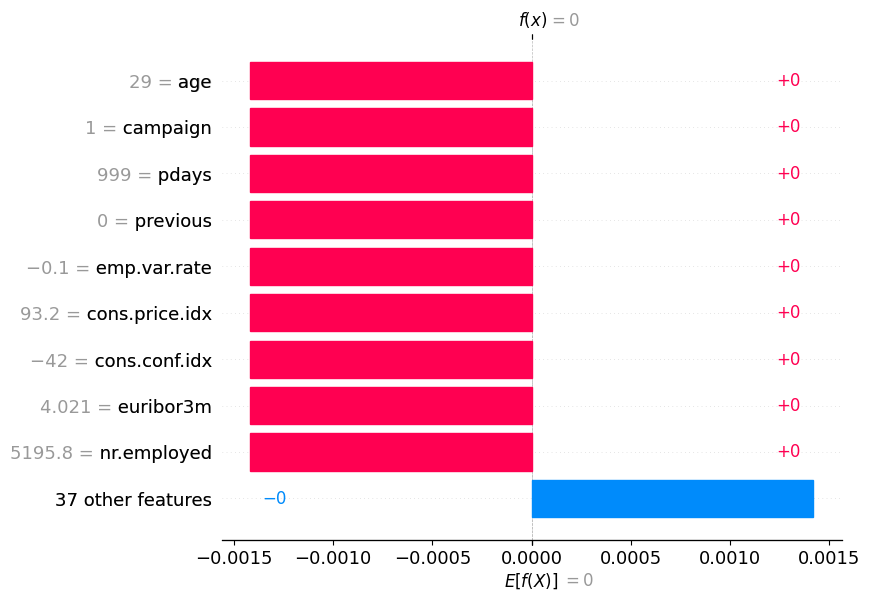

SHAP: (46,)
Features: (46,)


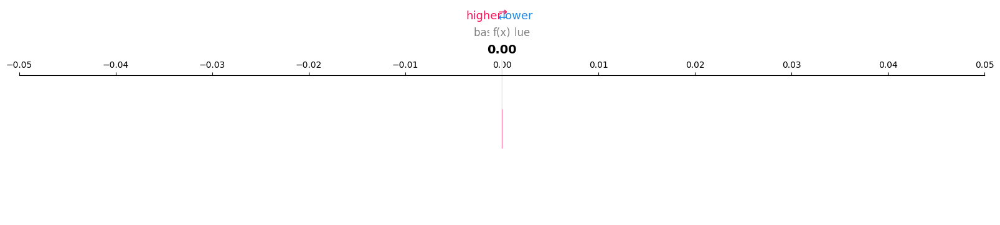

In [ ]:
print("\n--- SHAP EXPLANATION (MLP FINAL - ERROR FREE) ---")

import shap
import numpy as np
import pandas as pd

# -------------------------------
# STEP 1: Prepare Data
# -------------------------------
feature_names = X.columns.tolist()

X_train_df = pd.DataFrame(X_train, columns=feature_names).astype(float)
X_test_df  = pd.DataFrame(X_test,  columns=feature_names).astype(float)

# -------------------------------
# STEP 2: Speed Control
# -------------------------------
X_background = X_train_df.sample(10, random_state=42)
X_sample     = X_test_df.sample(5, random_state=42)

# -------------------------------
# STEP 3: SHAP Explainer
# -------------------------------
explainer = shap.KernelExplainer(
    best_mlp.predict_proba,
    X_background
)

# -------------------------------
# STEP 4: SHAP Values
# -------------------------------
shap_values = explainer.shap_values(X_sample)

# -------------------------------
# STEP 5: FIX SHAPE (CRITICAL)
# -------------------------------
if isinstance(shap_values, list):
    shap_vals = shap_values[1]   # binary → class 1
    base_val  = explainer.expected_value[1]
else:
    if len(shap_values.shape) == 3:
        shap_vals = shap_values[:, :, 1]   # pick class 1
        base_val  = explainer.expected_value[1]
    else:
        shap_vals = shap_values
        base_val  = explainer.expected_value

# Ensure scalar base value
if isinstance(base_val, (list, np.ndarray)):
    base_val = float(np.array(base_val).flatten()[0])

# Debug (optional)
print("SHAP shape:", shap_vals.shape)
print("X_sample shape:", X_sample.shape)

# -------------------------------
# STEP 6: GLOBAL IMPORTANCE
# -------------------------------
shap.summary_plot(shap_vals, X_sample, plot_type="bar")

# -------------------------------
# STEP 7: LOCAL EXPLANATION
# -------------------------------
exp = shap.Explanation(
    values=shap_vals[0],
    base_values=base_val,
    data=X_sample.iloc[0],
    feature_names=feature_names
)

# Stable plot (no errors)
shap.plots.waterfall(exp)

# Optional interactive plot
# shap.plots.force(exp)

# -------------------------------
# FORCE PLOT (FINAL - CORRECT)
# -------------------------------

# Select single sample
sample = X_sample.iloc[0]

# Get correct SHAP values (class 1)
if isinstance(shap_values, list):
    shap_val = shap_values[1][0]   # class 1
    base_val = explainer.expected_value[1]
else:
    if len(shap_values.shape) == 3:
        shap_val = shap_values[0, :, 1]
        base_val = explainer.expected_value[1]
    else:
        shap_val = shap_values[0]
        base_val = explainer.expected_value

# Ensure correct shape
shap_val = np.array(shap_val).reshape(-1)
sample_vals = sample.values.reshape(-1)

# Final check
print("SHAP:", shap_val.shape)
print("Features:", sample_vals.shape)

# Plot
shap.force_plot(
    float(base_val),
    shap_val,
    sample_vals,
    matplotlib=True
)

In [ ]:
print("\n--- LIME EXPLANATION (MLP) ---")

from lime.lime_tabular import LimeTabularExplainer
import numpy as np

# -------------------------------
# STEP 1: Prepare data
# -------------------------------
feature_names = X.columns.tolist()
class_names = ['Class 0', 'Class 1']  # change if needed

# Convert to numpy (LIME needs numpy)
X_train_np = np.array(X_train)
X_test_np  = np.array(X_test)

# -------------------------------
# STEP 2: Create Explainer
# -------------------------------
explainer = LimeTabularExplainer(
    training_data=X_train_np,
    feature_names=feature_names,
    class_names=class_names,
    mode='classification'
)

# -------------------------------
# STEP 3: Select sample
# -------------------------------
i = 0   # you can change index
sample = X_test_np[i]

# -------------------------------
# STEP 4: Explain prediction
# -------------------------------
exp = explainer.explain_instance(
    data_row=sample,
    predict_fn=best_mlp.predict_proba,
    num_features=10
)

# -------------------------------
# STEP 5: Show explanation
# -------------------------------
exp.show_in_notebook(show_table=True)

# -------------------------------
# STEP 6: Print explanation
# -------------------------------
print("\nFeature Contributions:")
for feature, weight in exp.as_list():
    print(f"{feature}: {weight:.4f}")


--- LIME EXPLANATION (MLP) ---



Feature Contributions:
age <= 32.00: 0.0000
campaign > 3.00: 0.0000
pdays <= 999.00: 0.0000
previous <= 0.00: 0.0000
1.10 < emp.var.rate <= 1.40: 0.0000
93.75 < cons.price.idx <= 93.99: 0.0000
cons.conf.idx <= -42.70: 0.0000
4.86 < euribor3m <= 4.96: 0.0000
5191.00 < nr.employed <= 5228.10: 0.0000
job_blue-collar <= 0.00: 0.0000


# **CREATE FINAL RESULTS FILE**

In [ ]:
# ==============================
# CREATE FINAL RESULTS FILE
# ==============================

import pandas as pd

df_all = pd.concat([
    df_lr,        # Logistic Regression
    df_dt,        # Decision Tree
    df_rf,        # Random Forest
    df_gbm,       # Gradient Boosting
    df_xgb,       # XGBoost
    df_lgb,       # LightGBM
    df_results,   # CatBoost
    df_knn,       # KNN
    df_mlp        # MLP
], ignore_index=True)
# Save file
file_path = "/content/your_results.csv"
df_all.to_csv(file_path, index=False)

print("✅ Results file created:", file_path)

# Check structure
print(df_all.head())
print(df_all.columns)

✅ Results file created: /content/your_results.csv
   Fold           Classifier  Accuracy  Precision    Recall  Specificity  \
0     1  Logistic Regression  0.778101   0.289720  0.668103     0.792066   
1     2  Logistic Regression  0.779315   0.289499  0.659483     0.794528   
2     3  Logistic Regression  0.774217   0.283457  0.657328     0.789056   
3     4  Logistic Regression  0.773731   0.284530  0.665948     0.787415   
4     5  Logistic Regression  0.788784   0.305927  0.689655     0.801368   

         F1        GM       FPR       AUC       MCC     Kappa  \
0  0.404172  0.727449  0.207934  0.788897  0.331779  0.293079   
1  0.402367  0.723863  0.205472  0.779773  0.328646  0.291427   
2  0.396104  0.720186  0.210944  0.783070  0.321258  0.283281   
3  0.398710  0.724139  0.212585  0.785010  0.325310  0.286003   
4  0.423841  0.743416  0.198632  0.800135  0.356663  0.317293   

   Balanced Accuracy  Training Time (s)  
0           0.730085           1.727304  
1           0.7270

# ** wilcoxon**

In [ ]:
import pandas as pd
from scipy.stats import wilcoxon
from itertools import combinations
from statsmodels.stats.multitest import multipletests

# ==============================
# LOAD FILE
# ==============================
file_path = "/content/your_results.csv"
df = pd.read_csv(file_path)

# -------------------------------
# CHECK REQUIRED COLUMNS
# -------------------------------
required_cols = ["Fold", "Classifier"]

for col in required_cols:
    if col not in df.columns:
        raise ValueError(f"❌ Missing column: {col}")

# -------------------------------
# METRICS
# -------------------------------
metrics = [
    "Accuracy", "AUC", "F1", "FPR", "GM",
    "Kappa", "MCC", "Precision", "Recall", "Specificity"
]

lower_is_better = ["FPR"]

all_results = []

# ==============================
# LOOP METRICS
# ==============================
for metric in metrics:

    if metric not in df.columns:
        print(f"⚠️ Skipping: {metric}")
        continue

    print(f"\nProcessing: {metric}")

    pivot = df.pivot(index="Fold", columns="Classifier", values=metric)

    models = pivot.columns

    # -------------------------------
    # ✅ UNIQUE PAIRWISE (NO DUPLICATE)
    # -------------------------------
    for m1, m2 in combinations(models, 2):

        scores1 = pivot[m1].dropna()
        scores2 = pivot[m2].dropna()

        # Align folds
        common_idx = scores1.index.intersection(scores2.index)
        scores1 = scores1.loc[common_idx]
        scores2 = scores2.loc[common_idx]

        if len(scores1) < 5:
            continue

        # Wilcoxon test
        stat, p = wilcoxon(scores1, scores2)

        mean1 = scores1.mean()
        mean2 = scores2.mean()

        # Determine better model
        if metric in lower_is_better:
            better = m1 if mean1 < mean2 else m2
        else:
            better = m1 if mean1 > mean2 else m2

        all_results.append({
            "Metric": metric,
            "Model 1": m1,
            "Model 2": m2,
            "Mean 1": round(mean1, 4),
            "Mean 2": round(mean2, 4),
            "Better Model": better,
            "Statistic": round(stat, 4),
            "p-value": p
        })

# ==============================
# CREATE DATAFRAME
# ==============================
results_df = pd.DataFrame(all_results)

# -------------------------------
# HOLM CORRECTION
# -------------------------------
reject, p_adj, _, _ = multipletests(results_df["p-value"], method='holm')

results_df["Adjusted p-value"] = p_adj
results_df["Significant"] = ["Yes" if r else "No" for r in reject]

# -------------------------------
# ROUND VALUES
# -------------------------------
results_df["p-value"] = results_df["p-value"].round(5)
results_df["Adjusted p-value"] = results_df["Adjusted p-value"].round(5)

# -------------------------------
# SORT RESULTS
# -------------------------------
results_df = results_df.sort_values(by=["Metric", "Adjusted p-value"])

# ==============================
# SAVE OUTPUT
# ==============================
output_file = "/content/wilcoxon_final_output.xlsx"
results_df.to_excel(output_file, index=False)

print("\n✅ FINAL RESULT SAVED:", output_file)

# 🔥 PRINT OUTPUT
print("\n===== FINAL RESULTS =====")
print(results_df.to_string(index=False))


Processing: Accuracy

Processing: AUC

Processing: F1

Processing: FPR

Processing: GM

Processing: Kappa

Processing: MCC

Processing: Precision

Processing: Recall

Processing: Specificity

✅ FINAL RESULT SAVED: /content/wilcoxon_final_output.xlsx

===== FINAL RESULTS =====
     Metric             Model 1             Model 2  Mean 1  Mean 2        Better Model  Statistic  p-value  Adjusted p-value Significant
        AUC            CatBoost       Decision Tree  0.7986  0.6519            CatBoost        0.0  0.00195           0.70312          No
        AUC            CatBoost   Gradient Boosting  0.7986  0.7910            CatBoost        0.0  0.00195           0.70312          No
        AUC            CatBoost                 KNN  0.7986  0.7202            CatBoost        0.0  0.00195           0.70312          No
        AUC            CatBoost            LightGBM  0.7986  0.7903            CatBoost        0.0  0.00195           0.70312          No
        AUC            CatBoost 

# **Topcis**

In [ ]:
import pandas as pd

# ==============================
# LOAD DATA
# ==============================
file_path = "/content/your_results.csv"
df = pd.read_csv(file_path)

# -------------------------------
# METRICS
# -------------------------------
metrics = [
    "Accuracy", "Precision", "Recall", "Specificity",
    "F1", "GM", "FPR", "AUC", "MCC", "Kappa", "Balanced Accuracy"
]

lower_is_better = ["FPR"]

# -------------------------------
# MEAN PERFORMANCE PER MODEL
# -------------------------------
df_mean = df.groupby("Classifier")[metrics].mean().reset_index()

# -------------------------------
# LONG FORMAT
# -------------------------------
df_long = df_mean.melt(
    id_vars="Classifier",
    var_name="Metric",
    value_name="Score"
)

# Rename column for your format
df_long.rename(columns={"Classifier": "Model"}, inplace=True)

# -------------------------------
# RANKING (FIXED)
# -------------------------------
df_long["Rank"] = df_long.groupby("Metric")["Score"].rank(
    method="average",
    ascending=False
)

# FIX: FPR (lower is better)
mask = df_long["Metric"] == "FPR"
df_long.loc[mask, "Rank"] = (
    df_long[mask]
    .groupby("Metric")["Score"]
    .rank(method="average", ascending=True)
)

# -------------------------------
# SORT OUTPUT
# -------------------------------
df_long = df_long.sort_values(by=["Metric", "Rank"])

# -------------------------------
# SAVE FILE
# -------------------------------
output_file = "/content/final_metric_ranking.xlsx"
df_long.to_excel(output_file, index=False)

# -------------------------------
# PRINT OUTPUT
# -------------------------------
print("\n✅ FINAL RESULT:\n")
print(df_long.to_string(index=False))

print("\n📁 Saved file:", output_file)


✅ FINAL RESULT:

              Model            Metric    Score  Rank
           CatBoost               AUC 0.798586   1.0
      Random Forest               AUC 0.793803   2.0
  Gradient Boosting               AUC 0.790980   3.0
           LightGBM               AUC 0.790333   4.0
            XGBoost               AUC 0.790093   5.0
Logistic Regression               AUC 0.789530   6.0
                KNN               AUC 0.720157   7.0
                MLP               AUC 0.717012   8.0
      Decision Tree               AUC 0.651877   9.0
           LightGBM          Accuracy 0.897300   1.0
            XGBoost          Accuracy 0.897106   2.0
  Gradient Boosting          Accuracy 0.893998   3.0
           CatBoost          Accuracy 0.883146   4.0
      Random Forest          Accuracy 0.869841   5.0
      Decision Tree          Accuracy 0.856779   6.0
                MLP          Accuracy 0.823760   7.0
                KNN          Accuracy 0.812251   8.0
Logistic Regression         

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import nbformat
import os

def find_notebook(filename, search_path="/content"):
    for root, dirs, files in os.walk(search_path):
        if filename in files:
            return os.path.join(root, filename)
    return None

notebook_filename = "model-comparison-lime.ipynb"

# 🔍 Search for the notebook
notebook_path = find_notebook(notebook_filename)

if notebook_path is None:
    print("❌ Notebook not found anywhere.")
else:
    print(f"✅ Found notebook at: {notebook_path}")

    # 📖 Read notebook
    nb = nbformat.read(notebook_path, as_version=4)

    # 🧹 Remove widget metadata safely
    if "widgets" in nb.metadata:
        del nb.metadata["widgets"]
        print("🧹 Removed widget metadata")
    else:
        print("ℹ️ No widget metadata found")

    # 💾 Save back
    nbformat.write(nb, notebook_path)

    print("🎉 Notebook fixed successfully!")

✅ Found notebook at: /content/drive/MyDrive/Colab Notebooks/model-comparison-lime.ipynb
ℹ️ No widget metadata found
🎉 Notebook fixed successfully!
